# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

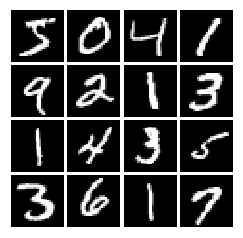

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(alpha*x, x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform((batch_size, dim),-1, 1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [8]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(256, input_shape=(784,)),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [9]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [10]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(1024, input_shape=(noise_dim,), activation='relu'),
        tf.keras.layers.Dense(1024, activation='relu'),
        tf.keras.layers.Dense(784, activation='tanh')

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [11]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [12]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    binary_crossentropy = tf.keras.losses.binary_crossentropy
    bce_real = binary_crossentropy(y_true=tf.ones(logits_real.shape), 
                                   y_pred=logits_real, from_logits=True)
    bce_fake = binary_crossentropy(y_true=tf.zeros(logits_fake.shape), 
                                   y_pred=logits_fake, from_logits=True)
    loss = tf.reduce_mean(bce_fake) + tf.reduce_mean(bce_real) 
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    bce = tf.keras.losses.binary_crossentropy(y_true=tf.ones(logits_fake.shape),
                                               y_pred=logits_fake, from_logits=True)
    loss = tf.reduce_mean(bce)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [13]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

W0901 20:03:19.042052 139822212478720 deprecation.py:323] From /home/isdgenomics/users/dipamcha/hw/tf2/lib/python3.6/site-packages/tensorflow/python/ops/nn_impl.py:182: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Maximum error in d_loss: 0


In [14]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 7.19722e-17


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [15]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.optimizers.Adam(learning_rate=1e-3, beta_1=0.5)
    G_solver = tf.optimizers.Adam(learning_rate=1e-3, beta_1=0.5)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [16]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.184, G:0.7073


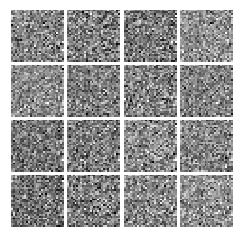

Epoch: 0, Iter: 20, D: 0.574, G:0.9814


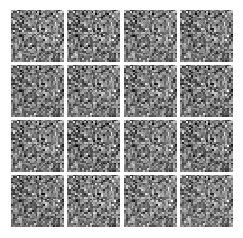

Epoch: 0, Iter: 40, D: 0.6618, G:1.588


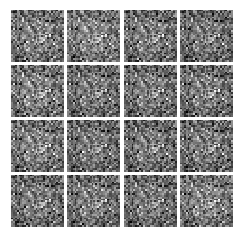

Epoch: 0, Iter: 60, D: 1.698, G:1.622


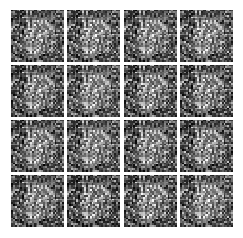

Epoch: 0, Iter: 80, D: 1.134, G:1.994


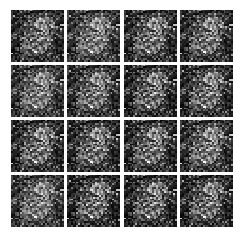

Epoch: 0, Iter: 100, D: 1.133, G:1.422


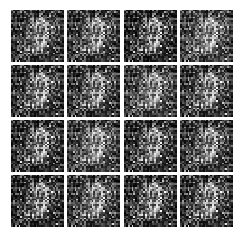

Epoch: 0, Iter: 120, D: 1.114, G:1.802


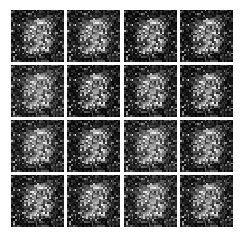

Epoch: 0, Iter: 140, D: 1.71, G:1.176


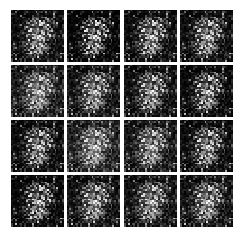

Epoch: 0, Iter: 160, D: 0.9851, G:1.274


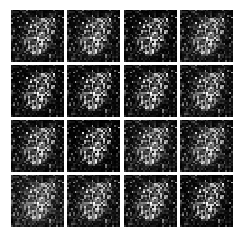

Epoch: 0, Iter: 180, D: 0.8814, G:1.672


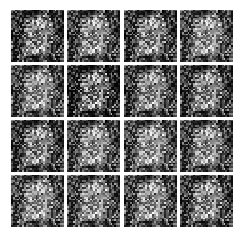

Epoch: 0, Iter: 200, D: 1.024, G:2.446


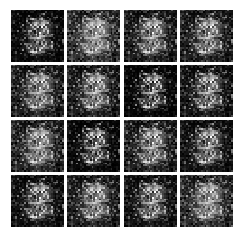

Epoch: 0, Iter: 220, D: 1.014, G:1.329


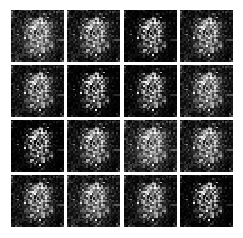

Epoch: 0, Iter: 240, D: 1.498, G:0.6314


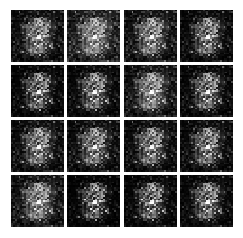

Epoch: 0, Iter: 260, D: 1.665, G:1.312


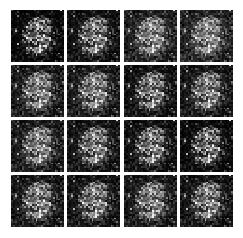

Epoch: 0, Iter: 280, D: 1.332, G:0.9714


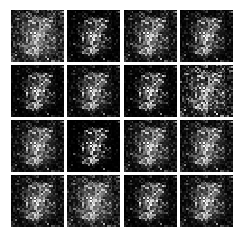

Epoch: 0, Iter: 300, D: 0.859, G:2.146


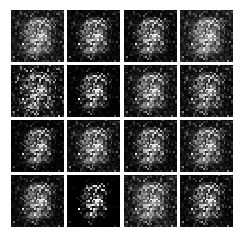

Epoch: 0, Iter: 320, D: 1.246, G:1.423


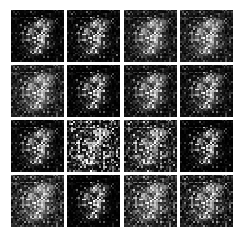

Epoch: 0, Iter: 340, D: 0.7929, G:1.132


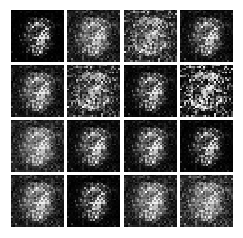

Epoch: 0, Iter: 360, D: 1.28, G:1.508


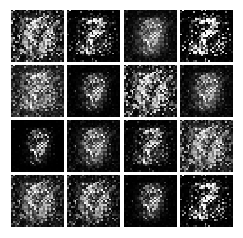

Epoch: 0, Iter: 380, D: 1.208, G:1.06


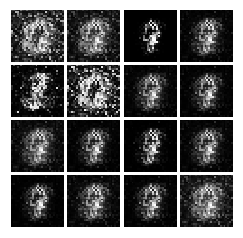

Epoch: 0, Iter: 400, D: 1.084, G:1.625


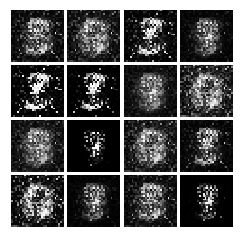

Epoch: 0, Iter: 420, D: 1.701, G:0.8237


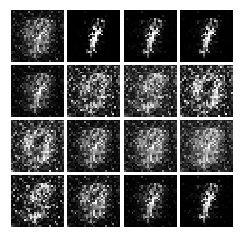

Epoch: 0, Iter: 440, D: 1.482, G:1.272


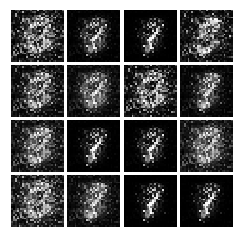

Epoch: 0, Iter: 460, D: 0.8557, G:0.9848


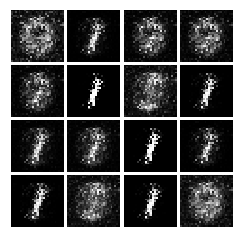

Epoch: 1, Iter: 480, D: 1.56, G:2.329


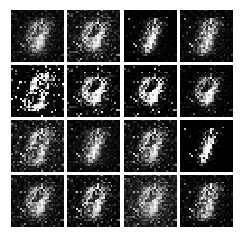

Epoch: 1, Iter: 500, D: 0.9465, G:1.729


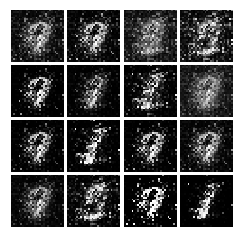

Epoch: 1, Iter: 520, D: 1.048, G:1.624


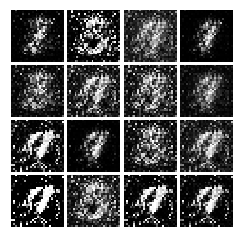

Epoch: 1, Iter: 540, D: 1.036, G:1.224


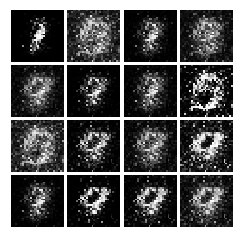

Epoch: 1, Iter: 560, D: 1.085, G:1.28


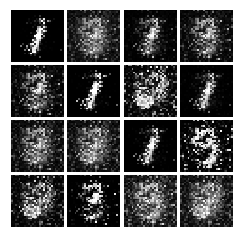

Epoch: 1, Iter: 580, D: 1.335, G:0.8459


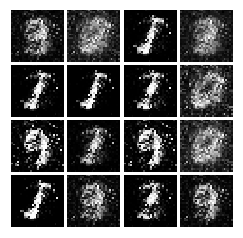

Epoch: 1, Iter: 600, D: 1.045, G:1.594


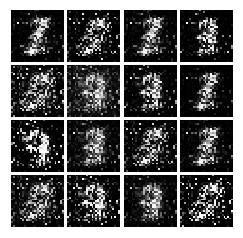

Epoch: 1, Iter: 620, D: 1.179, G:1.613


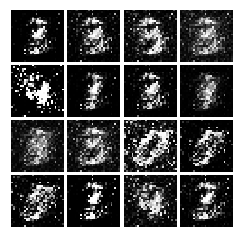

Epoch: 1, Iter: 640, D: 1.183, G:1.172


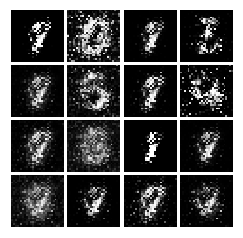

Epoch: 1, Iter: 660, D: 1.056, G:0.868


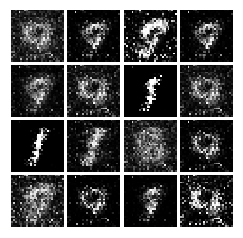

Epoch: 1, Iter: 680, D: 0.9707, G:1.204


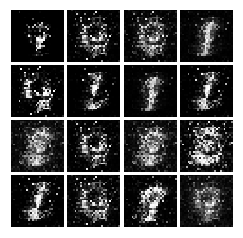

Epoch: 1, Iter: 700, D: 1.586, G:0.6187


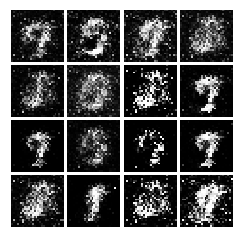

Epoch: 1, Iter: 720, D: 1.221, G:1.059


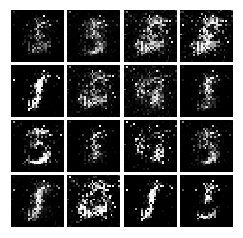

Epoch: 1, Iter: 740, D: 1.278, G:1.174


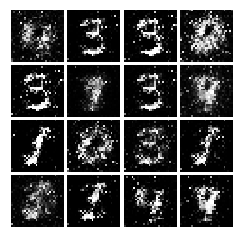

Epoch: 1, Iter: 760, D: 1.287, G:2.198


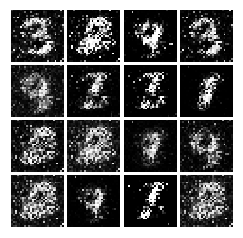

Epoch: 1, Iter: 780, D: 1.649, G:0.3755


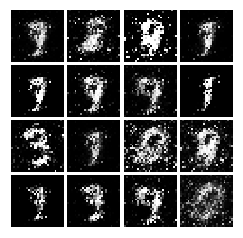

Epoch: 1, Iter: 800, D: 1.099, G:1.659


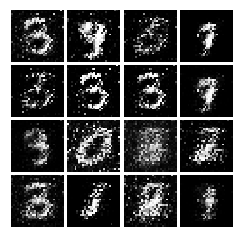

Epoch: 1, Iter: 820, D: 1.444, G:0.7547


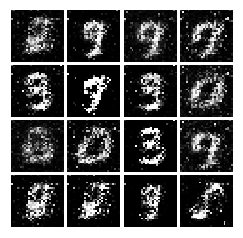

Epoch: 1, Iter: 840, D: 1.412, G:0.3862


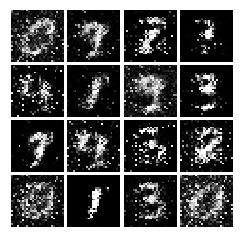

Epoch: 1, Iter: 860, D: 1.369, G:0.953


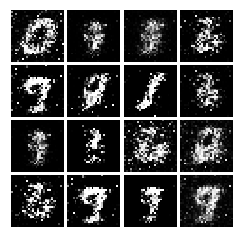

Epoch: 1, Iter: 880, D: 1.258, G:1.117


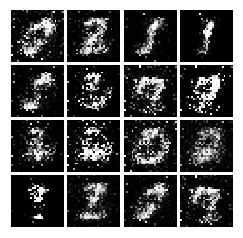

Epoch: 1, Iter: 900, D: 1.226, G:1.011


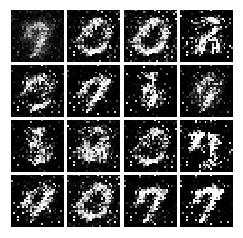

Epoch: 1, Iter: 920, D: 1.181, G:1.055


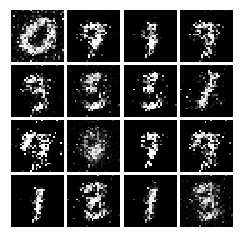

Epoch: 2, Iter: 940, D: 1.197, G:1.0


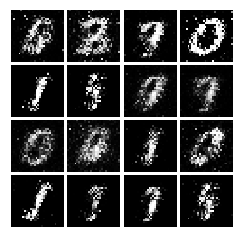

Epoch: 2, Iter: 960, D: 1.229, G:0.7299


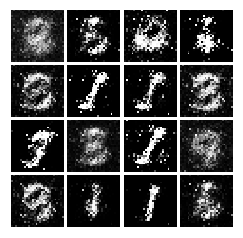

Epoch: 2, Iter: 980, D: 1.263, G:0.9314


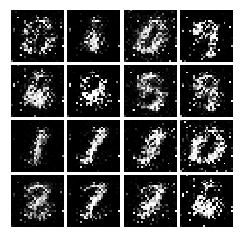

Epoch: 2, Iter: 1000, D: 1.284, G:1.001


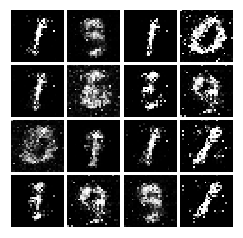

Epoch: 2, Iter: 1020, D: 1.153, G:1.102


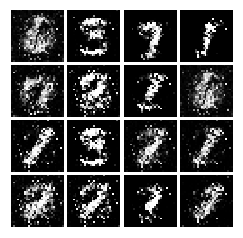

Epoch: 2, Iter: 1040, D: 1.189, G:0.9908


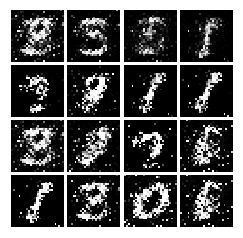

Epoch: 2, Iter: 1060, D: 1.034, G:1.474


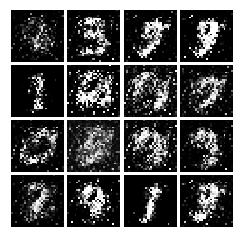

Epoch: 2, Iter: 1080, D: 0.9529, G:1.614


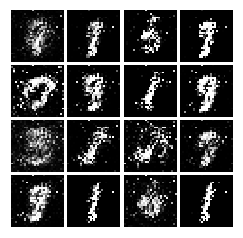

Epoch: 2, Iter: 1100, D: 1.065, G:1.138


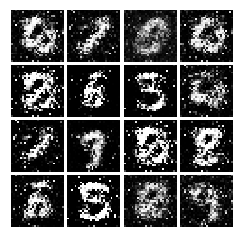

Epoch: 2, Iter: 1120, D: 1.259, G:1.099


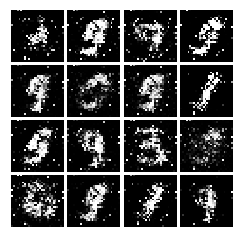

Epoch: 2, Iter: 1140, D: 1.306, G:0.8812


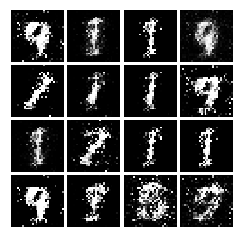

Epoch: 2, Iter: 1160, D: 1.135, G:0.9408


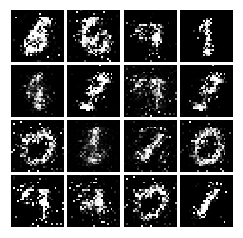

Epoch: 2, Iter: 1180, D: 1.274, G:1.535


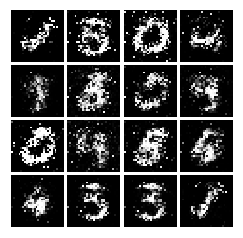

Epoch: 2, Iter: 1200, D: 1.134, G:1.081


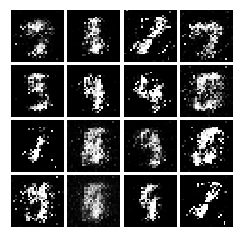

Epoch: 2, Iter: 1220, D: 1.091, G:1.185


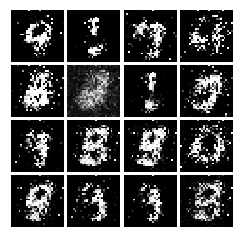

Epoch: 2, Iter: 1240, D: 1.106, G:0.9945


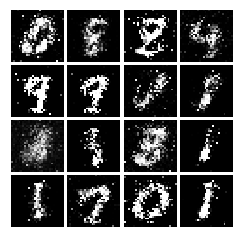

Epoch: 2, Iter: 1260, D: 1.316, G:1.008


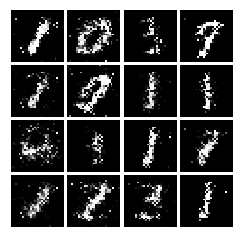

Epoch: 2, Iter: 1280, D: 1.191, G:1.339


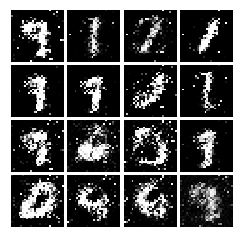

Epoch: 2, Iter: 1300, D: 1.233, G:1.439


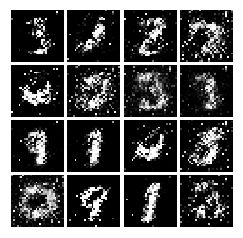

Epoch: 2, Iter: 1320, D: 1.201, G:1.113


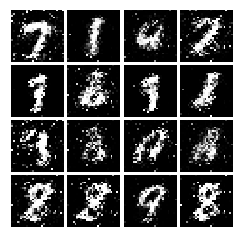

Epoch: 2, Iter: 1340, D: 1.114, G:1.248


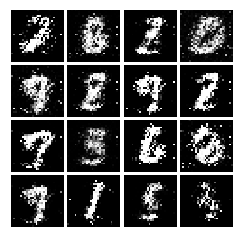

Epoch: 2, Iter: 1360, D: 1.305, G:1.206


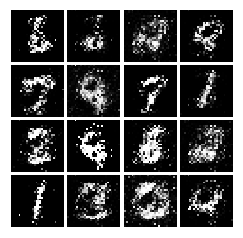

Epoch: 2, Iter: 1380, D: 1.044, G:1.242


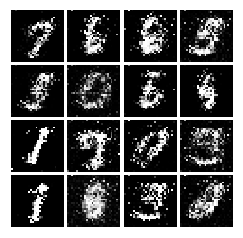

Epoch: 2, Iter: 1400, D: 1.145, G:1.009


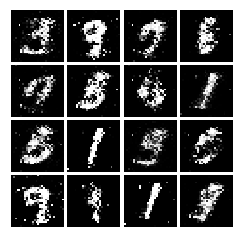

Epoch: 3, Iter: 1420, D: 1.302, G:0.9323


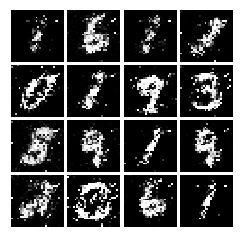

Epoch: 3, Iter: 1440, D: 1.164, G:1.035


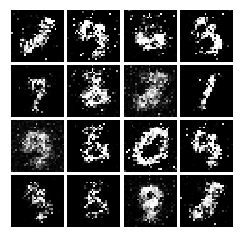

Epoch: 3, Iter: 1460, D: 1.276, G:1.366


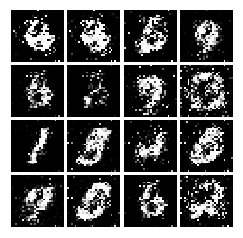

Epoch: 3, Iter: 1480, D: 1.186, G:1.118


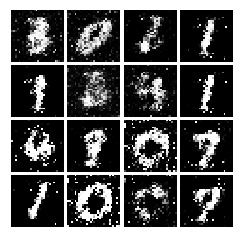

Epoch: 3, Iter: 1500, D: 1.231, G:0.8929


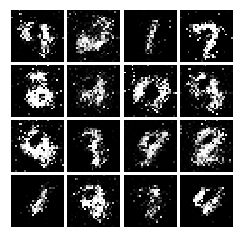

Epoch: 3, Iter: 1520, D: 1.325, G:0.8835


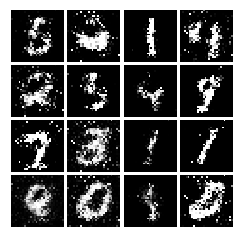

Epoch: 3, Iter: 1540, D: 1.067, G:1.259


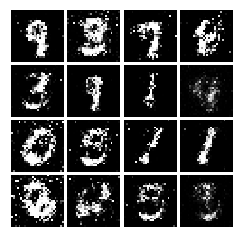

Epoch: 3, Iter: 1560, D: 1.282, G:0.9407


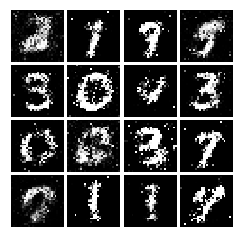

Epoch: 3, Iter: 1580, D: 1.286, G:1.003


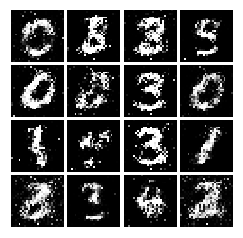

Epoch: 3, Iter: 1600, D: 1.147, G:0.9213


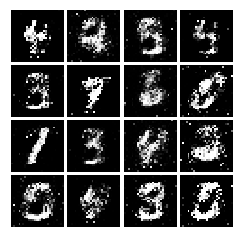

Epoch: 3, Iter: 1620, D: 1.216, G:0.9107


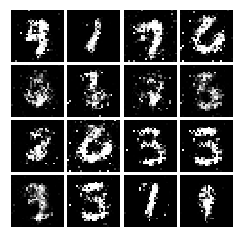

Epoch: 3, Iter: 1640, D: 1.316, G:0.8891


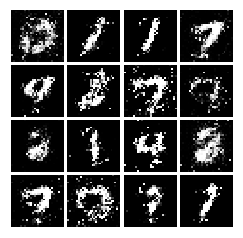

Epoch: 3, Iter: 1660, D: 1.114, G:1.216


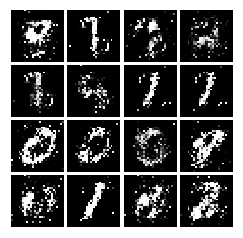

Epoch: 3, Iter: 1680, D: 1.093, G:0.9542


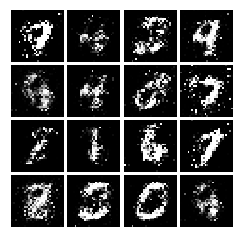

Epoch: 3, Iter: 1700, D: 1.429, G:0.9857


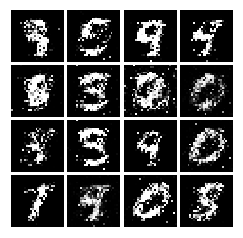

Epoch: 3, Iter: 1720, D: 1.235, G:0.9624


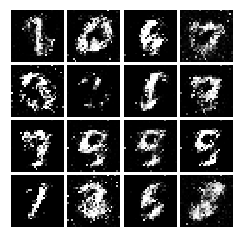

Epoch: 3, Iter: 1740, D: 1.236, G:0.8963


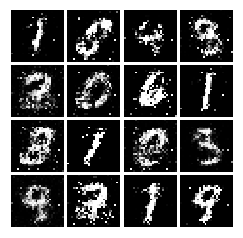

Epoch: 3, Iter: 1760, D: 1.119, G:1.157


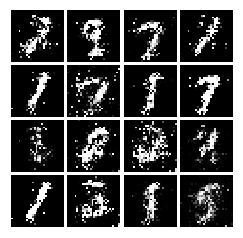

Epoch: 3, Iter: 1780, D: 1.237, G:0.9594


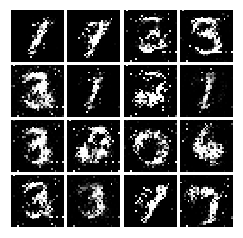

Epoch: 3, Iter: 1800, D: 1.358, G:0.8985


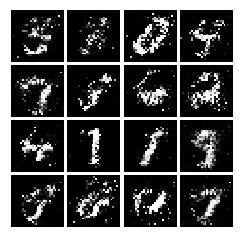

Epoch: 3, Iter: 1820, D: 1.229, G:0.9624


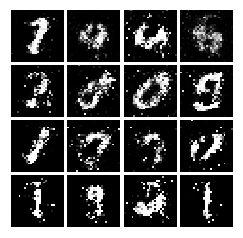

Epoch: 3, Iter: 1840, D: 1.165, G:0.886


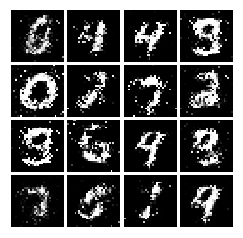

Epoch: 3, Iter: 1860, D: 1.251, G:0.8731


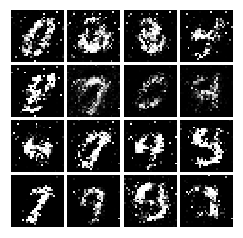

Epoch: 4, Iter: 1880, D: 1.196, G:1.062


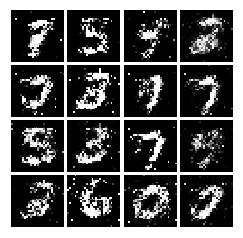

Epoch: 4, Iter: 1900, D: 1.257, G:0.9449


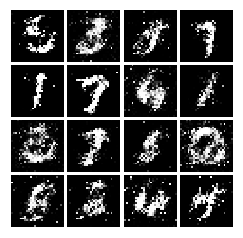

Epoch: 4, Iter: 1920, D: 1.296, G:0.8681


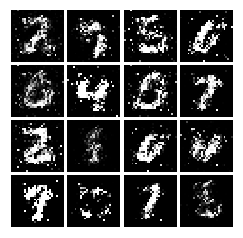

Epoch: 4, Iter: 1940, D: 1.125, G:1.102


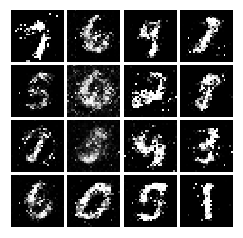

Epoch: 4, Iter: 1960, D: 1.271, G:0.8324


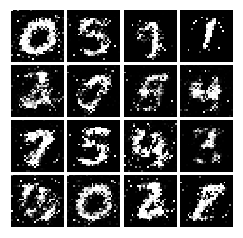

Epoch: 4, Iter: 1980, D: 1.237, G:0.8977


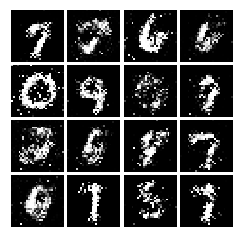

Epoch: 4, Iter: 2000, D: 1.263, G:0.8917


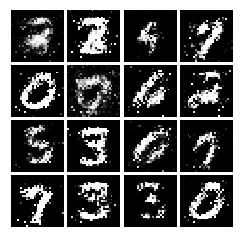

Epoch: 4, Iter: 2020, D: 1.246, G:0.9248


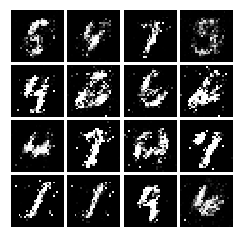

Epoch: 4, Iter: 2040, D: 1.164, G:1.296


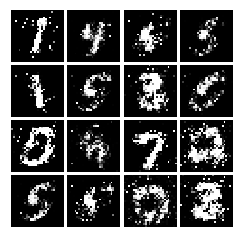

Epoch: 4, Iter: 2060, D: 1.501, G:0.7365


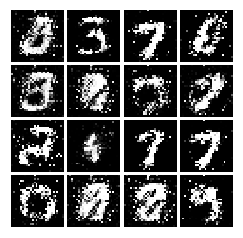

Epoch: 4, Iter: 2080, D: 1.271, G:0.9184


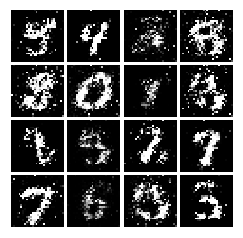

Epoch: 4, Iter: 2100, D: 1.329, G:0.9117


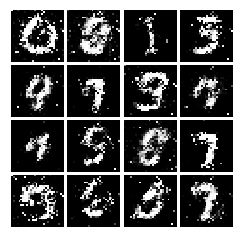

Epoch: 4, Iter: 2120, D: 1.241, G:0.8381


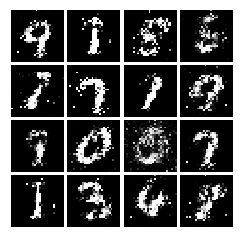

Epoch: 4, Iter: 2140, D: 1.275, G:0.7727


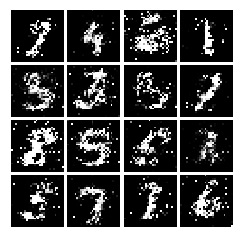

Epoch: 4, Iter: 2160, D: 1.413, G:0.7865


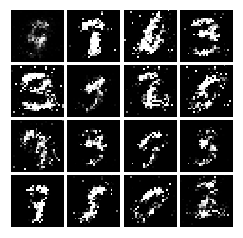

Epoch: 4, Iter: 2180, D: 1.223, G:0.7561


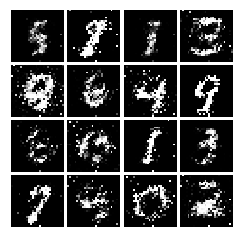

Epoch: 4, Iter: 2200, D: 1.24, G:0.8889


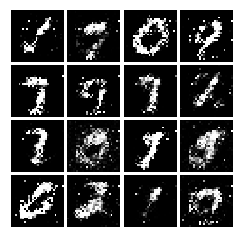

Epoch: 4, Iter: 2220, D: 1.286, G:0.9423


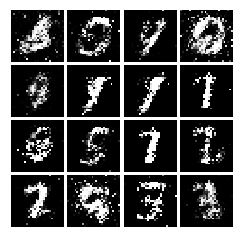

Epoch: 4, Iter: 2240, D: 1.321, G:0.9998


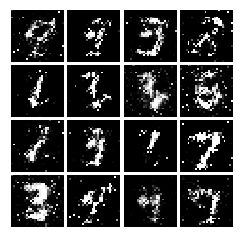

Epoch: 4, Iter: 2260, D: 1.281, G:1.072


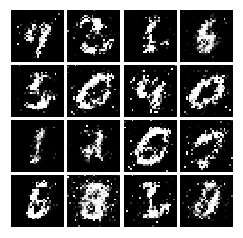

Epoch: 4, Iter: 2280, D: 1.294, G:0.9462


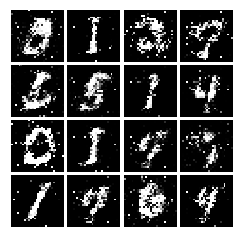

Epoch: 4, Iter: 2300, D: 1.347, G:0.812


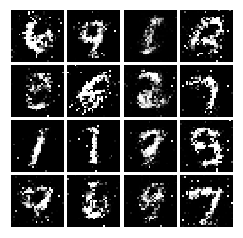

Epoch: 4, Iter: 2320, D: 1.312, G:0.8864


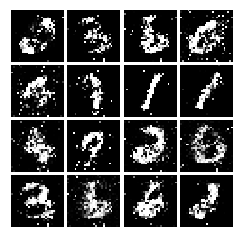

Epoch: 4, Iter: 2340, D: 1.204, G:1.131


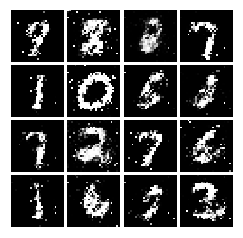

Epoch: 5, Iter: 2360, D: 1.231, G:1.009


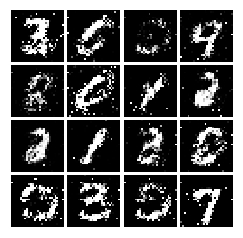

Epoch: 5, Iter: 2380, D: 1.196, G:0.778


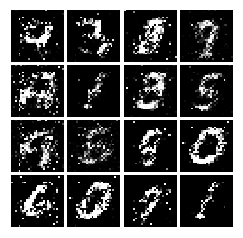

Epoch: 5, Iter: 2400, D: 1.266, G:0.8984


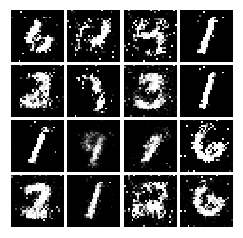

Epoch: 5, Iter: 2420, D: 1.28, G:0.8668


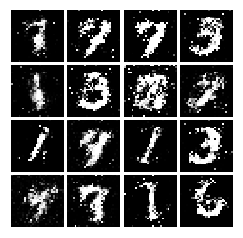

Epoch: 5, Iter: 2440, D: 1.368, G:0.4308


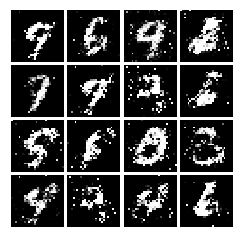

Epoch: 5, Iter: 2460, D: 1.085, G:1.044


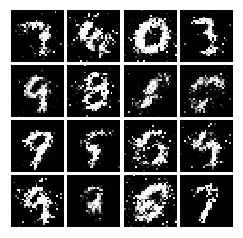

Epoch: 5, Iter: 2480, D: 1.222, G:1.026


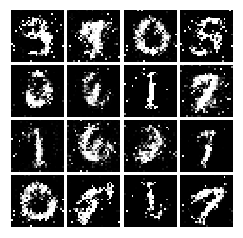

Epoch: 5, Iter: 2500, D: 1.311, G:0.8502


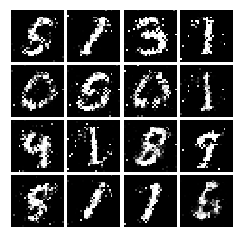

Epoch: 5, Iter: 2520, D: 1.458, G:0.8203


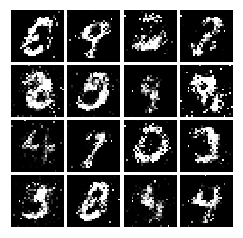

Epoch: 5, Iter: 2540, D: 1.258, G:0.8527


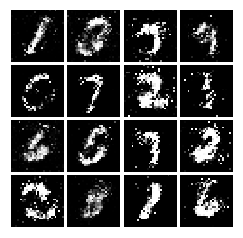

Epoch: 5, Iter: 2560, D: 1.345, G:0.89


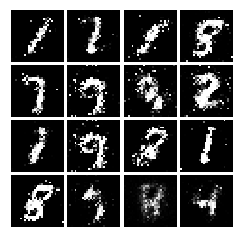

Epoch: 5, Iter: 2580, D: 1.226, G:0.861


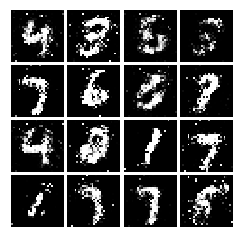

Epoch: 5, Iter: 2600, D: 1.457, G:0.7184


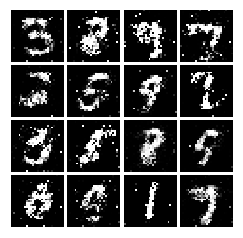

Epoch: 5, Iter: 2620, D: 1.265, G:0.9392


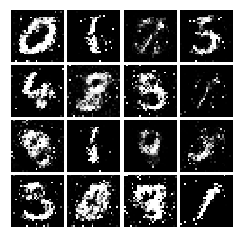

Epoch: 5, Iter: 2640, D: 1.306, G:0.897


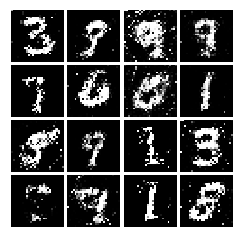

Epoch: 5, Iter: 2660, D: 1.322, G:0.8161


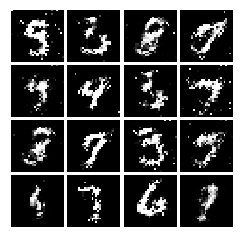

Epoch: 5, Iter: 2680, D: 1.321, G:0.8386


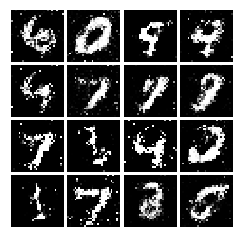

Epoch: 5, Iter: 2700, D: 1.286, G:0.8384


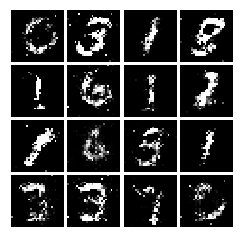

Epoch: 5, Iter: 2720, D: 1.316, G:0.7367


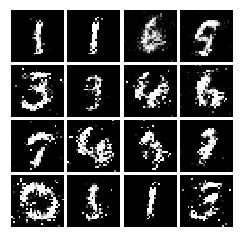

Epoch: 5, Iter: 2740, D: 1.381, G:1.172


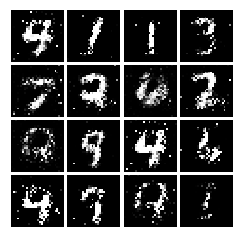

Epoch: 5, Iter: 2760, D: 1.285, G:0.873


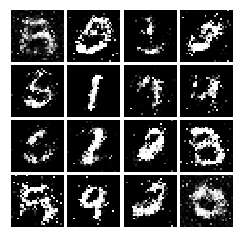

Epoch: 5, Iter: 2780, D: 1.294, G:0.7691


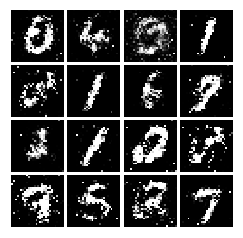

Epoch: 5, Iter: 2800, D: 1.228, G:0.882


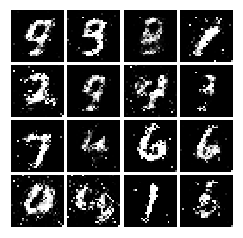

Epoch: 6, Iter: 2820, D: 1.397, G:0.7716


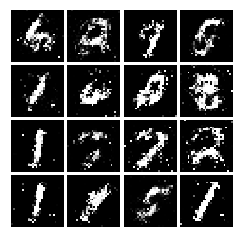

Epoch: 6, Iter: 2840, D: 1.262, G:0.816


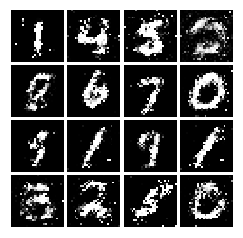

Epoch: 6, Iter: 2860, D: 1.24, G:0.9141


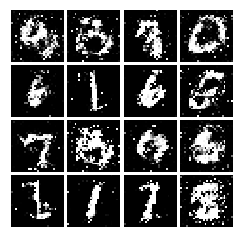

Epoch: 6, Iter: 2880, D: 1.253, G:0.8636


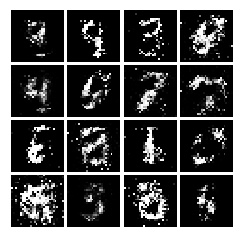

Epoch: 6, Iter: 2900, D: 1.288, G:0.8846


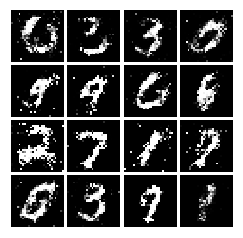

Epoch: 6, Iter: 2920, D: 1.351, G:0.8058


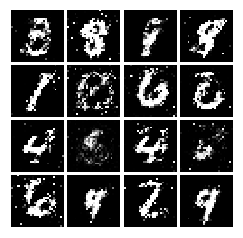

Epoch: 6, Iter: 2940, D: 1.332, G:0.8356


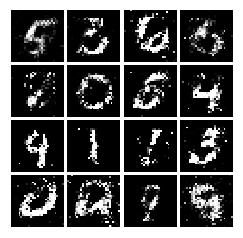

Epoch: 6, Iter: 2960, D: 1.293, G:0.8278


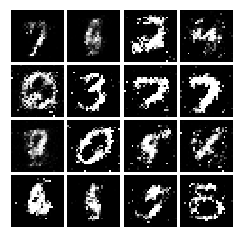

Epoch: 6, Iter: 2980, D: 1.336, G:0.8886


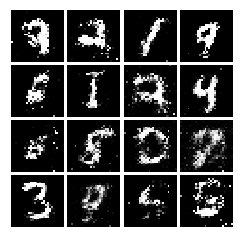

Epoch: 6, Iter: 3000, D: 1.36, G:0.8469


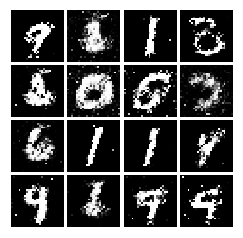

Epoch: 6, Iter: 3020, D: 1.36, G:0.8294


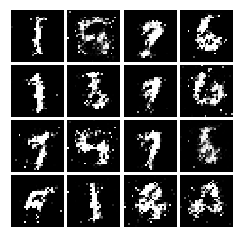

Epoch: 6, Iter: 3040, D: 1.339, G:0.8589


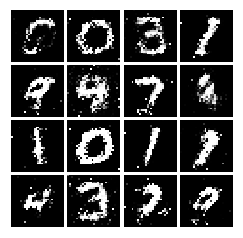

Epoch: 6, Iter: 3060, D: 1.369, G:0.7872


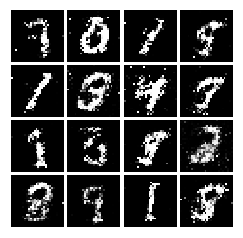

Epoch: 6, Iter: 3080, D: 1.322, G:0.8152


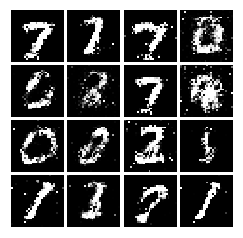

Epoch: 6, Iter: 3100, D: 1.431, G:0.8168


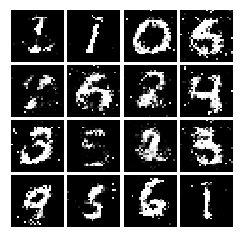

Epoch: 6, Iter: 3120, D: 1.363, G:0.6918


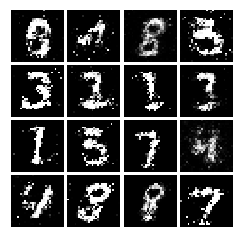

Epoch: 6, Iter: 3140, D: 1.332, G:0.8085


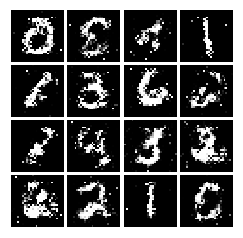

Epoch: 6, Iter: 3160, D: 1.342, G:0.807


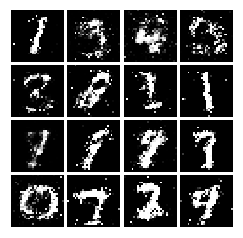

Epoch: 6, Iter: 3180, D: 1.317, G:0.749


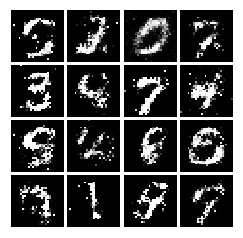

Epoch: 6, Iter: 3200, D: 1.317, G:0.834


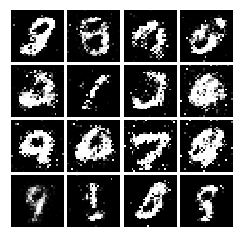

Epoch: 6, Iter: 3220, D: 1.344, G:0.8143


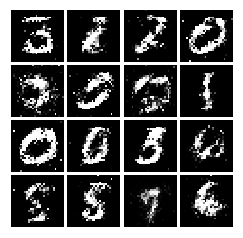

Epoch: 6, Iter: 3240, D: 1.239, G:0.8388


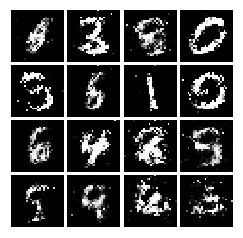

Epoch: 6, Iter: 3260, D: 1.355, G:0.772


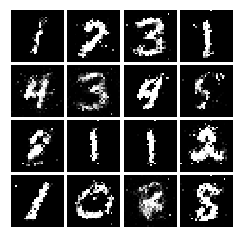

Epoch: 6, Iter: 3280, D: 1.236, G:0.7704


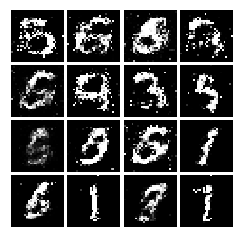

Epoch: 7, Iter: 3300, D: 1.321, G:0.7246


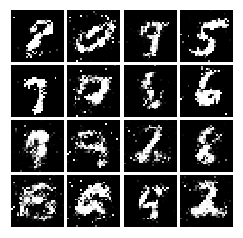

Epoch: 7, Iter: 3320, D: 1.301, G:0.7886


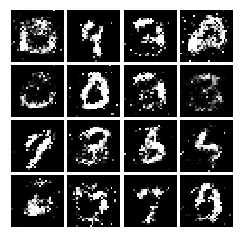

Epoch: 7, Iter: 3340, D: 1.317, G:0.7808


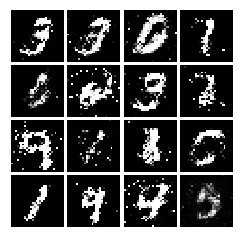

Epoch: 7, Iter: 3360, D: 1.376, G:0.771


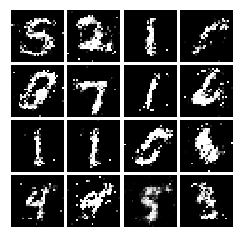

Epoch: 7, Iter: 3380, D: 1.365, G:0.7031


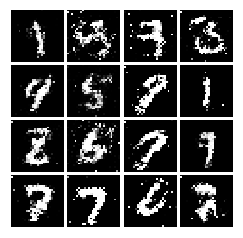

Epoch: 7, Iter: 3400, D: 1.376, G:0.7142


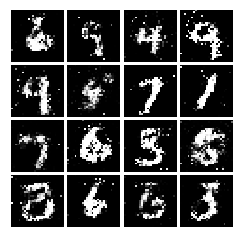

Epoch: 7, Iter: 3420, D: 1.392, G:0.7571


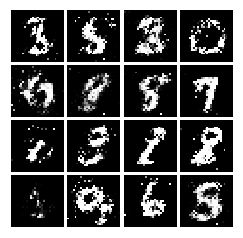

Epoch: 7, Iter: 3440, D: 1.293, G:0.7815


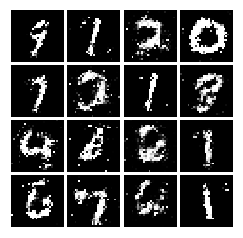

Epoch: 7, Iter: 3460, D: 1.341, G:0.7455


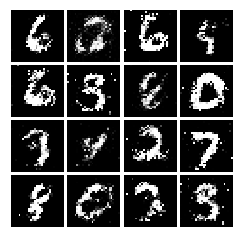

Epoch: 7, Iter: 3480, D: 1.466, G:0.7888


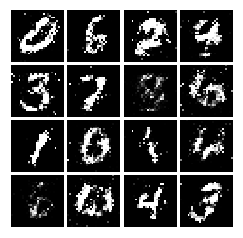

Epoch: 7, Iter: 3500, D: 1.314, G:0.8075


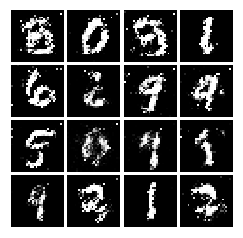

Epoch: 7, Iter: 3520, D: 1.347, G:0.7492


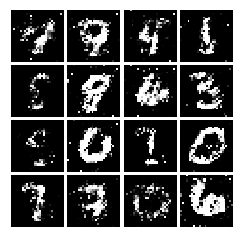

Epoch: 7, Iter: 3540, D: 1.267, G:0.746


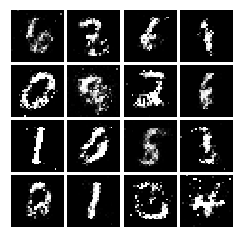

Epoch: 7, Iter: 3560, D: 1.327, G:0.7885


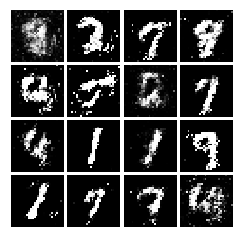

Epoch: 7, Iter: 3580, D: 1.379, G:0.7537


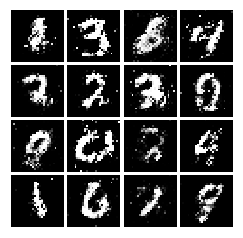

Epoch: 7, Iter: 3600, D: 1.275, G:0.7796


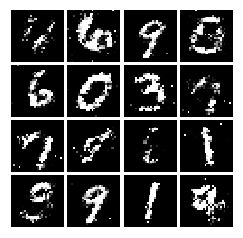

Epoch: 7, Iter: 3620, D: 1.292, G:0.751


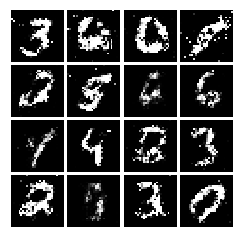

Epoch: 7, Iter: 3640, D: 1.322, G:0.7932


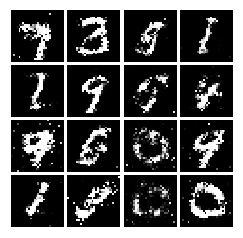

Epoch: 7, Iter: 3660, D: 1.306, G:0.8055


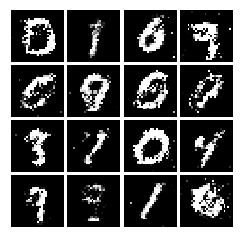

Epoch: 7, Iter: 3680, D: 1.34, G:0.8084


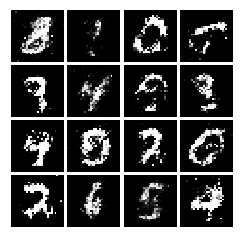

Epoch: 7, Iter: 3700, D: 1.336, G:0.8095


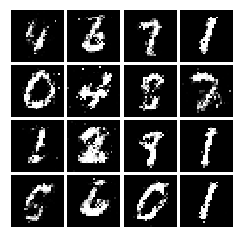

Epoch: 7, Iter: 3720, D: 1.36, G:0.9514


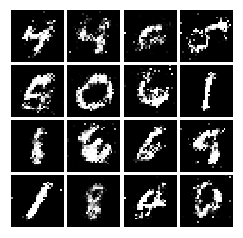

Epoch: 7, Iter: 3740, D: 1.371, G:0.742


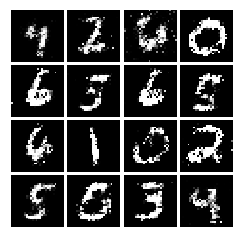

Epoch: 8, Iter: 3760, D: 1.374, G:0.8279


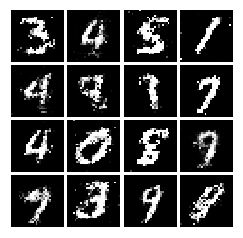

Epoch: 8, Iter: 3780, D: 1.404, G:0.8094


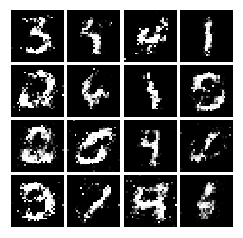

Epoch: 8, Iter: 3800, D: 1.324, G:0.8166


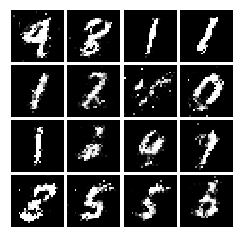

Epoch: 8, Iter: 3820, D: 1.316, G:0.8055


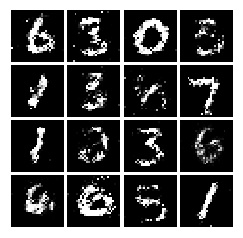

Epoch: 8, Iter: 3840, D: 1.42, G:0.8316


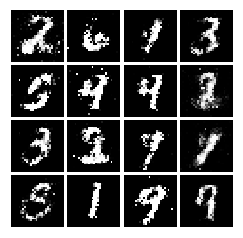

Epoch: 8, Iter: 3860, D: 1.339, G:0.7936


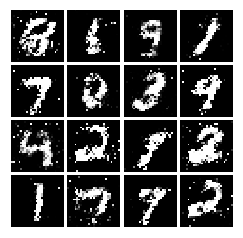

Epoch: 8, Iter: 3880, D: 1.356, G:0.7826


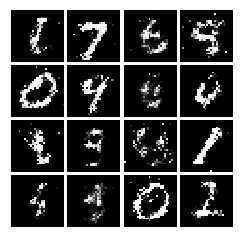

Epoch: 8, Iter: 3900, D: 1.309, G:0.8278


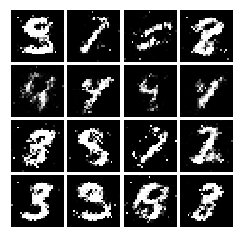

Epoch: 8, Iter: 3920, D: 1.295, G:0.804


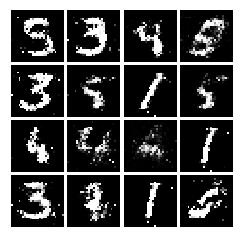

Epoch: 8, Iter: 3940, D: 1.36, G:0.8037


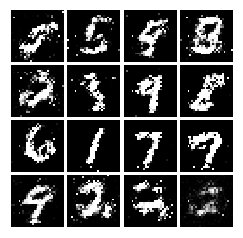

Epoch: 8, Iter: 3960, D: 1.302, G:0.8412


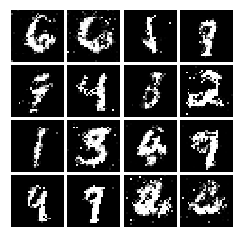

Epoch: 8, Iter: 3980, D: 1.394, G:0.7955


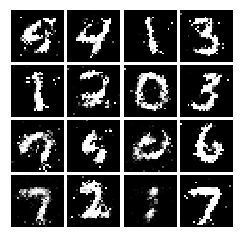

Epoch: 8, Iter: 4000, D: 1.341, G:0.8221


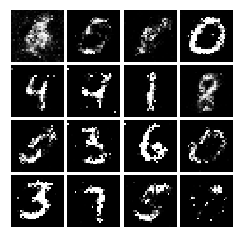

Epoch: 8, Iter: 4020, D: 1.367, G:0.7444


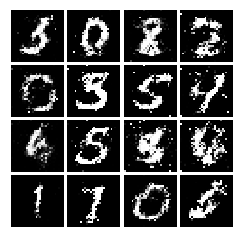

Epoch: 8, Iter: 4040, D: 1.353, G:0.7944


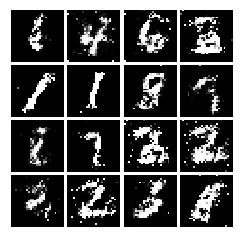

Epoch: 8, Iter: 4060, D: 1.334, G:0.729


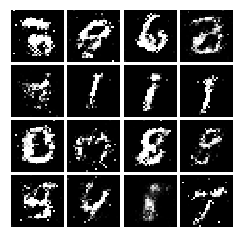

Epoch: 8, Iter: 4080, D: 1.363, G:0.8421


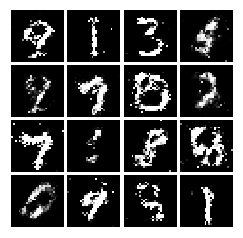

Epoch: 8, Iter: 4100, D: 1.385, G:0.7959


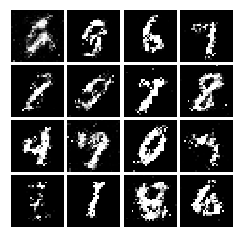

Epoch: 8, Iter: 4120, D: 1.378, G:0.8101


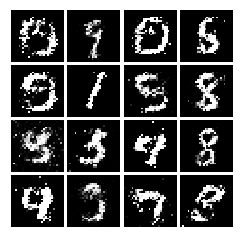

Epoch: 8, Iter: 4140, D: 1.331, G:0.7653


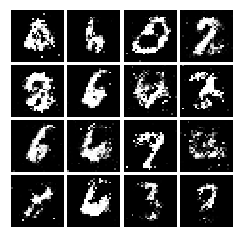

Epoch: 8, Iter: 4160, D: 1.306, G:0.7444


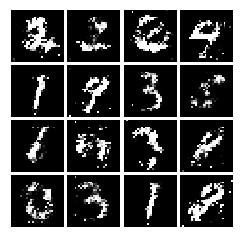

Epoch: 8, Iter: 4180, D: 1.406, G:0.7987


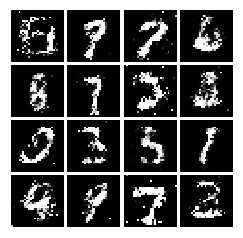

Epoch: 8, Iter: 4200, D: 1.327, G:0.7621


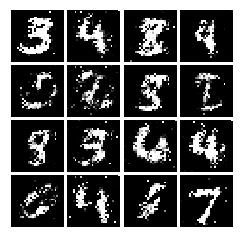

Epoch: 8, Iter: 4220, D: 1.411, G:0.8035


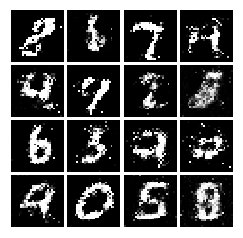

Epoch: 9, Iter: 4240, D: 1.394, G:0.7996


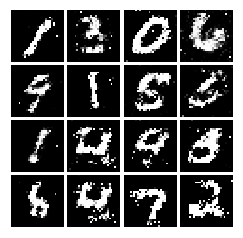

Epoch: 9, Iter: 4260, D: 1.323, G:0.7326


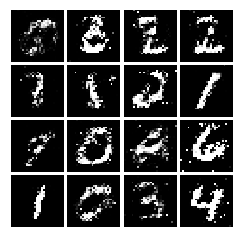

Epoch: 9, Iter: 4280, D: 1.4, G:0.7533


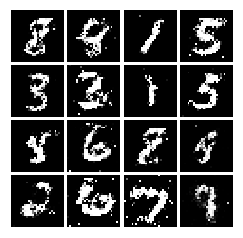

Epoch: 9, Iter: 4300, D: 1.407, G:0.8577


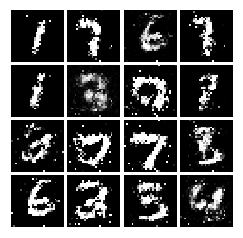

Epoch: 9, Iter: 4320, D: 1.357, G:0.812


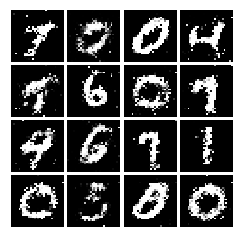

Epoch: 9, Iter: 4340, D: 1.285, G:0.8416


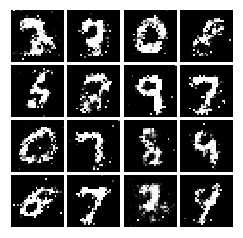

Epoch: 9, Iter: 4360, D: 1.338, G:0.8259


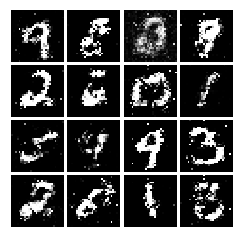

Epoch: 9, Iter: 4380, D: 1.321, G:0.8031


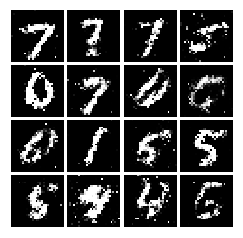

Epoch: 9, Iter: 4400, D: 1.26, G:0.8371


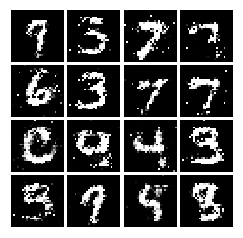

Epoch: 9, Iter: 4420, D: 1.344, G:0.7455


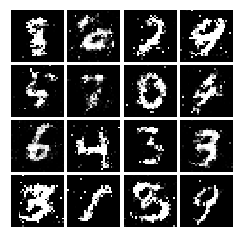

Epoch: 9, Iter: 4440, D: 1.326, G:0.8107


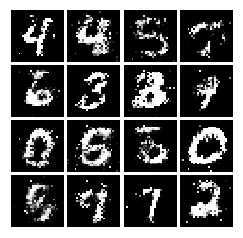

Epoch: 9, Iter: 4460, D: 1.347, G:0.7859


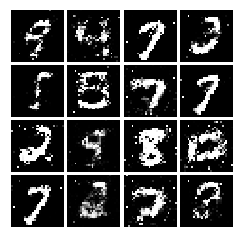

Epoch: 9, Iter: 4480, D: 1.33, G:0.7697


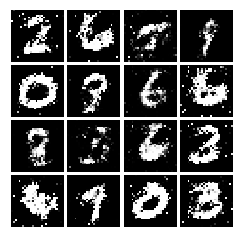

Epoch: 9, Iter: 4500, D: 1.475, G:0.7402


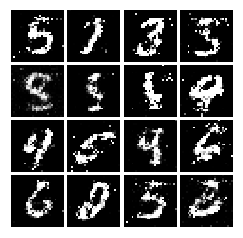

Epoch: 9, Iter: 4520, D: 1.415, G:0.7475


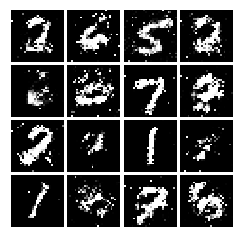

Epoch: 9, Iter: 4540, D: 1.327, G:0.7476


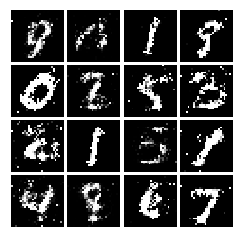

Epoch: 9, Iter: 4560, D: 1.355, G:0.7304


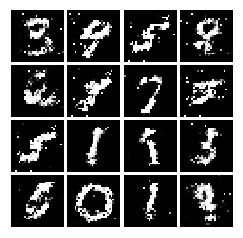

Epoch: 9, Iter: 4580, D: 1.365, G:0.7813


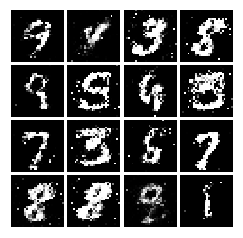

Epoch: 9, Iter: 4600, D: 1.317, G:0.7523


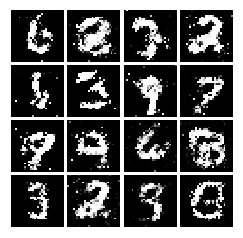

Epoch: 9, Iter: 4620, D: 1.371, G:0.7009


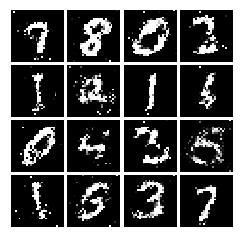

Epoch: 9, Iter: 4640, D: 1.377, G:0.7648


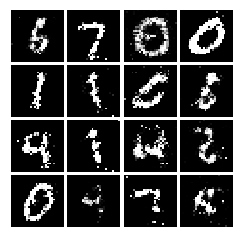

Epoch: 9, Iter: 4660, D: 1.336, G:0.8489


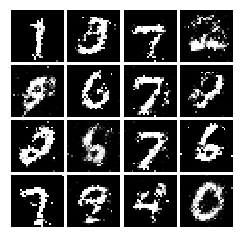

Epoch: 9, Iter: 4680, D: 1.395, G:0.8348


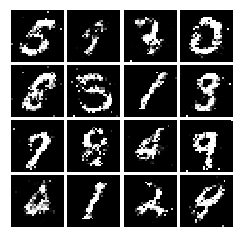

Final images


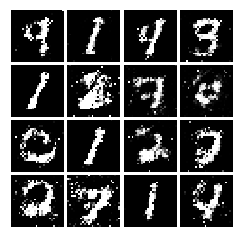

In [17]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [18]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    # Mean of the concatenation takes care of the 0.5 outside
    loss = tf.reduce_mean(tf.concat([((scores_real-1)**2), scores_fake**2], axis=0))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean((scores_fake-1)**2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [19]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.06618, G:0.6752


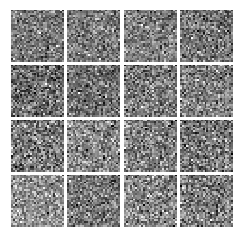

Epoch: 0, Iter: 20, D: 0.02203, G:0.8041


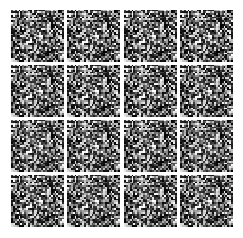

Epoch: 0, Iter: 40, D: 0.03687, G:0.846


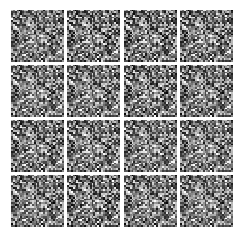

Epoch: 0, Iter: 60, D: 0.02941, G:0.528


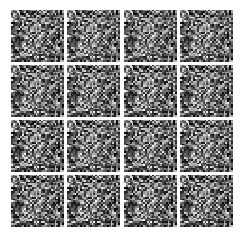

Epoch: 0, Iter: 80, D: 0.006965, G:0.6268


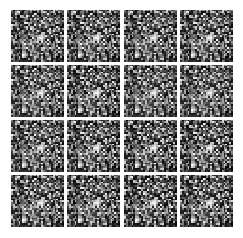

Epoch: 0, Iter: 100, D: 0.01526, G:0.698


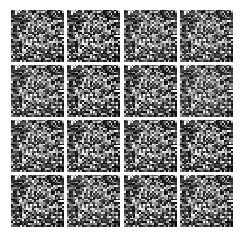

Epoch: 0, Iter: 120, D: 0.01789, G:0.5814


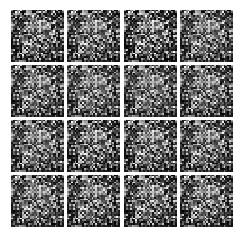

Epoch: 0, Iter: 140, D: 0.5731, G:0.9128


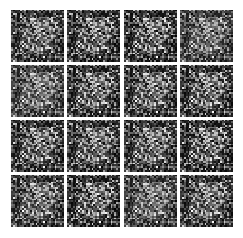

Epoch: 0, Iter: 160, D: 0.2972, G:0.3465


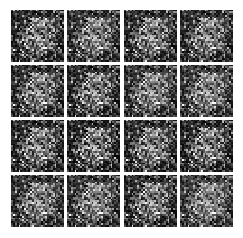

Epoch: 0, Iter: 180, D: 0.3892, G:0.8556


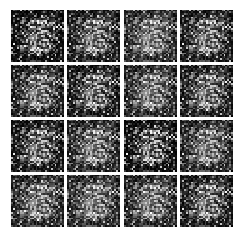

Epoch: 0, Iter: 200, D: 0.06817, G:0.4416


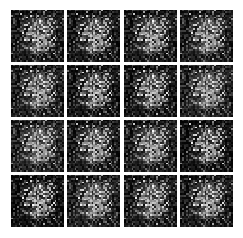

Epoch: 0, Iter: 220, D: 0.07819, G:0.3548


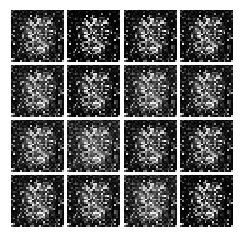

Epoch: 0, Iter: 240, D: 0.2884, G:0.2061


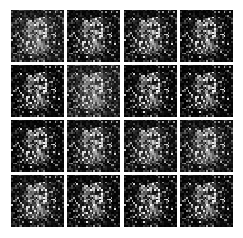

Epoch: 0, Iter: 260, D: 0.244, G:0.2772


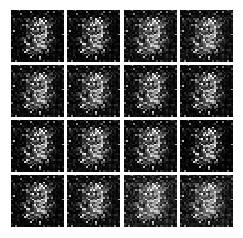

Epoch: 0, Iter: 280, D: 0.266, G:0.7024


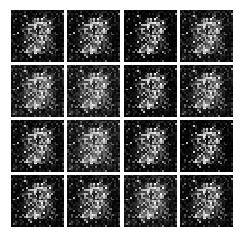

Epoch: 0, Iter: 300, D: 0.2526, G:0.04483


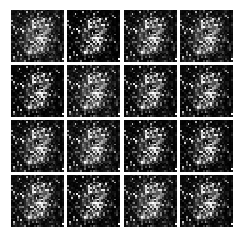

Epoch: 0, Iter: 320, D: 0.08187, G:0.4393


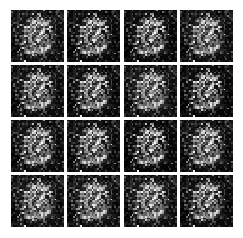

Epoch: 0, Iter: 340, D: 0.3133, G:0.5085


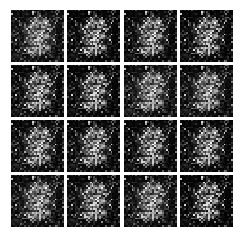

Epoch: 0, Iter: 360, D: 0.2289, G:0.1403


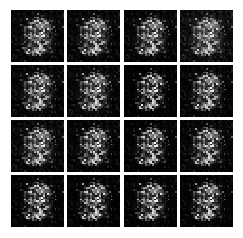

Epoch: 0, Iter: 380, D: 0.2096, G:0.4229


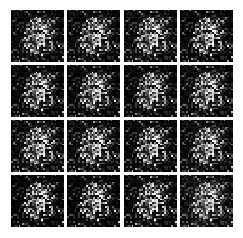

Epoch: 0, Iter: 400, D: 0.3957, G:0.5677


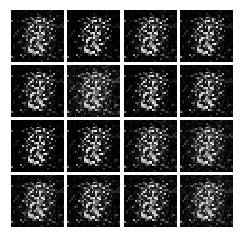

Epoch: 0, Iter: 420, D: 0.05335, G:0.6038


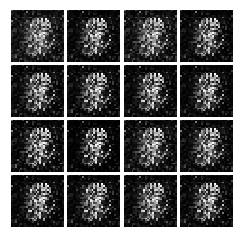

Epoch: 0, Iter: 440, D: 0.08534, G:0.4308


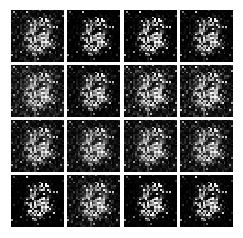

Epoch: 0, Iter: 460, D: 0.1091, G:0.3935


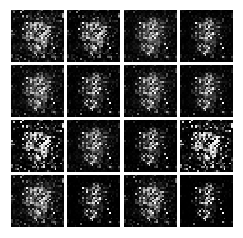

Epoch: 1, Iter: 480, D: 0.3183, G:0.4173


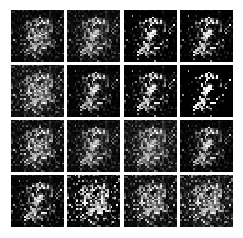

Epoch: 1, Iter: 500, D: 0.271, G:0.4251


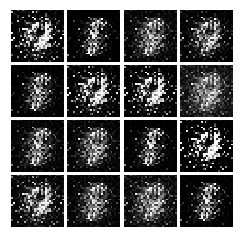

Epoch: 1, Iter: 520, D: 0.1604, G:0.3757


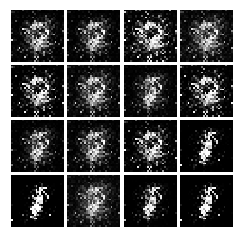

Epoch: 1, Iter: 540, D: 0.08475, G:0.3622


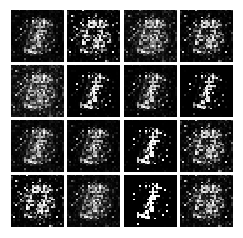

Epoch: 1, Iter: 560, D: 0.2028, G:0.09741


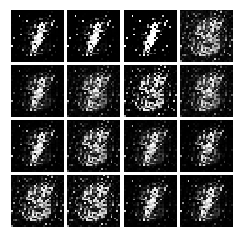

Epoch: 1, Iter: 580, D: 0.7855, G:1.138


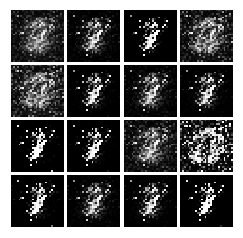

Epoch: 1, Iter: 600, D: 0.4961, G:0.07738


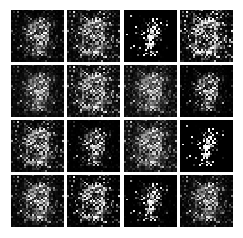

Epoch: 1, Iter: 620, D: 0.07085, G:0.4162


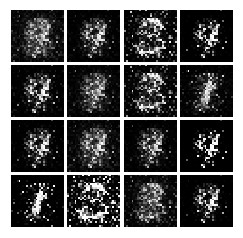

Epoch: 1, Iter: 640, D: 0.1378, G:0.4216


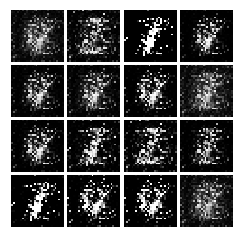

Epoch: 1, Iter: 660, D: 0.1406, G:0.4232


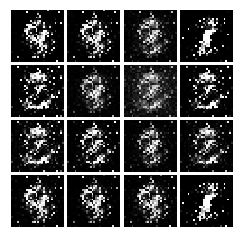

Epoch: 1, Iter: 680, D: 0.1482, G:0.3192


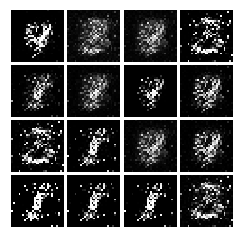

Epoch: 1, Iter: 700, D: 0.184, G:0.3398


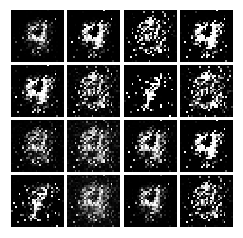

Epoch: 1, Iter: 720, D: 0.08958, G:0.6205


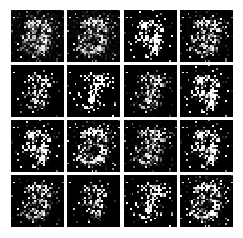

Epoch: 1, Iter: 740, D: 0.06146, G:0.4109


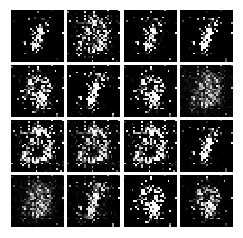

Epoch: 1, Iter: 760, D: 0.1014, G:0.4039


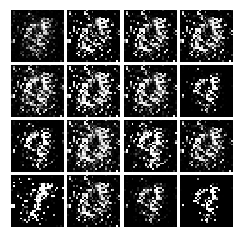

Epoch: 1, Iter: 780, D: 0.1516, G:0.2233


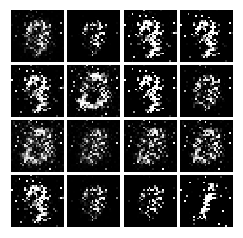

Epoch: 1, Iter: 800, D: 0.1825, G:0.1812


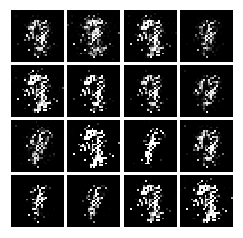

Epoch: 1, Iter: 820, D: 0.1312, G:0.3417


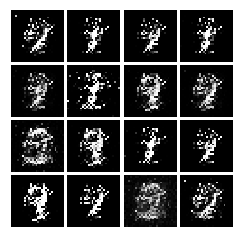

Epoch: 1, Iter: 840, D: 0.3557, G:0.4703


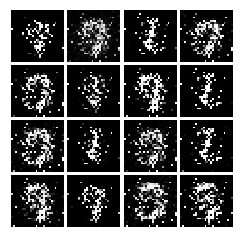

Epoch: 1, Iter: 860, D: 0.1139, G:0.3563


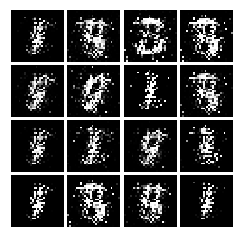

Epoch: 1, Iter: 880, D: 0.1185, G:0.5031


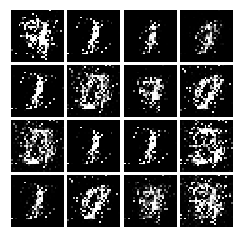

Epoch: 1, Iter: 900, D: 0.1585, G:0.3409


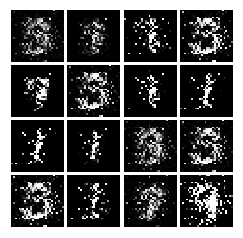

Epoch: 1, Iter: 920, D: 0.1025, G:0.3778


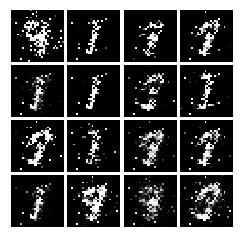

Epoch: 2, Iter: 940, D: 0.1701, G:0.6501


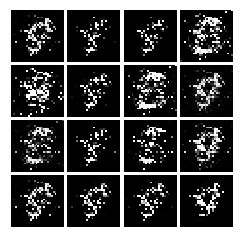

Epoch: 2, Iter: 960, D: 0.1142, G:0.3477


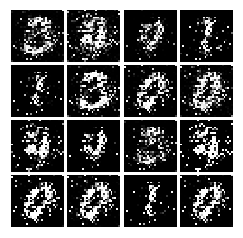

Epoch: 2, Iter: 980, D: 0.1542, G:0.1911


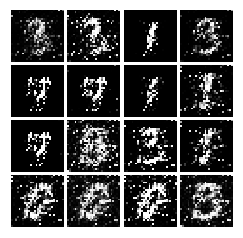

Epoch: 2, Iter: 1000, D: 0.1504, G:0.2868


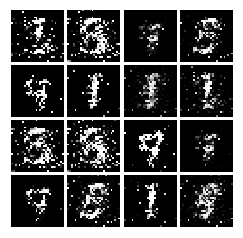

Epoch: 2, Iter: 1020, D: 0.144, G:0.3654


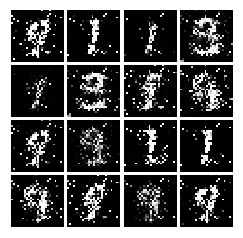

Epoch: 2, Iter: 1040, D: 0.116, G:0.4169


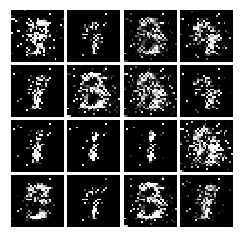

Epoch: 2, Iter: 1060, D: 0.1584, G:0.4815


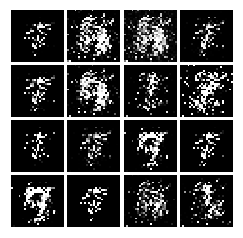

Epoch: 2, Iter: 1080, D: 0.129, G:0.4123


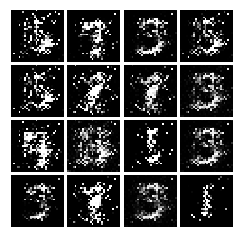

Epoch: 2, Iter: 1100, D: 0.1455, G:0.239


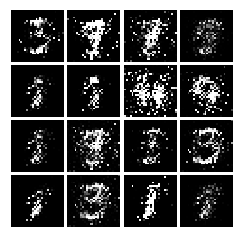

Epoch: 2, Iter: 1120, D: 0.1012, G:0.4322


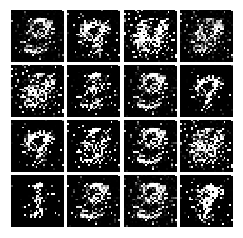

Epoch: 2, Iter: 1140, D: 0.1202, G:0.2913


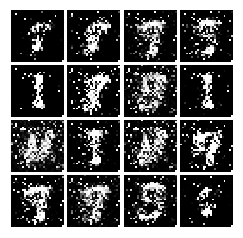

Epoch: 2, Iter: 1160, D: 0.146, G:0.2527


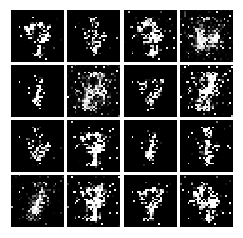

Epoch: 2, Iter: 1180, D: 0.1107, G:0.4664


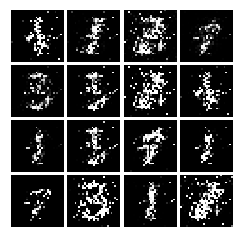

Epoch: 2, Iter: 1200, D: 0.1855, G:0.2481


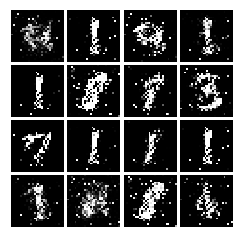

Epoch: 2, Iter: 1220, D: 0.2026, G:0.5996


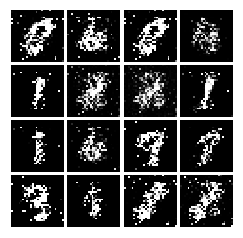

Epoch: 2, Iter: 1240, D: 0.1455, G:0.2652


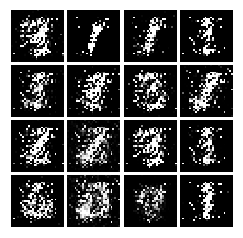

Epoch: 2, Iter: 1260, D: 0.1537, G:0.2852


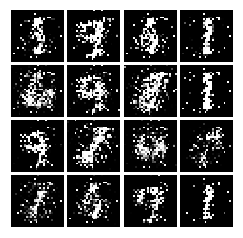

Epoch: 2, Iter: 1280, D: 0.1617, G:0.3255


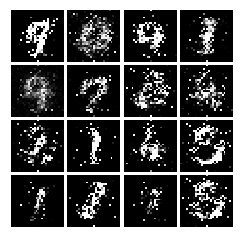

Epoch: 2, Iter: 1300, D: 0.161, G:0.2531


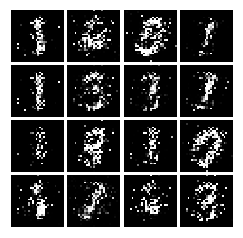

Epoch: 2, Iter: 1320, D: 0.2198, G:0.2612


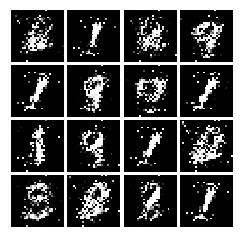

Epoch: 2, Iter: 1340, D: 0.1658, G:0.2482


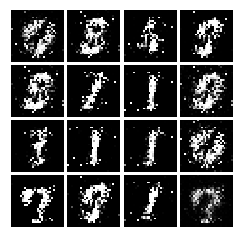

Epoch: 2, Iter: 1360, D: 0.1521, G:0.2972


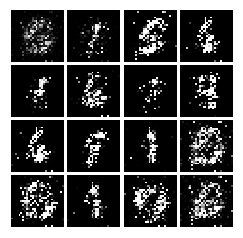

Epoch: 2, Iter: 1380, D: 0.2314, G:0.2265


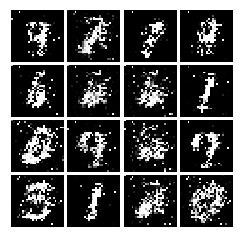

Epoch: 2, Iter: 1400, D: 0.171, G:0.2143


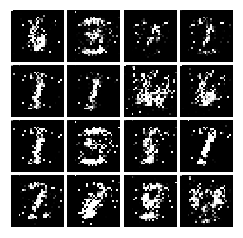

Epoch: 3, Iter: 1420, D: 0.2917, G:0.372


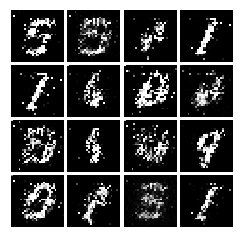

Epoch: 3, Iter: 1440, D: 0.1912, G:0.2804


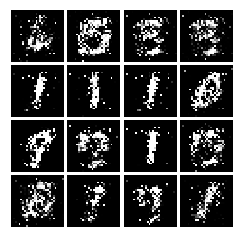

Epoch: 3, Iter: 1460, D: 0.208, G:0.5577


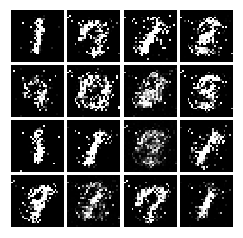

Epoch: 3, Iter: 1480, D: 0.2615, G:0.281


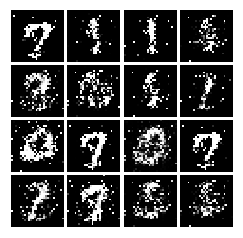

Epoch: 3, Iter: 1500, D: 0.1678, G:0.2558


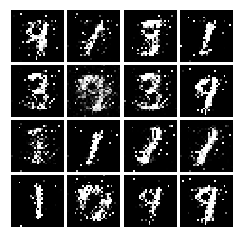

Epoch: 3, Iter: 1520, D: 0.1901, G:0.2341


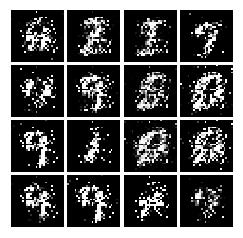

Epoch: 3, Iter: 1540, D: 0.167, G:0.2987


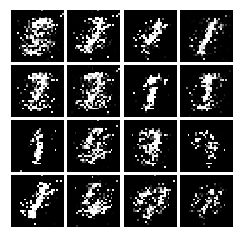

Epoch: 3, Iter: 1560, D: 0.1532, G:0.2557


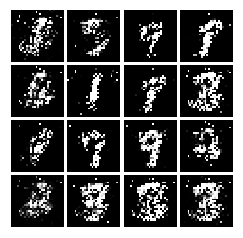

Epoch: 3, Iter: 1580, D: 0.2073, G:0.1774


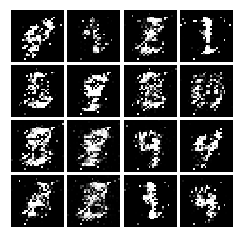

Epoch: 3, Iter: 1600, D: 0.1794, G:0.3077


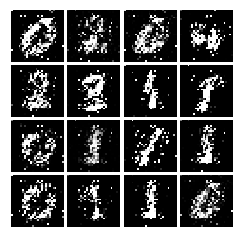

Epoch: 3, Iter: 1620, D: 0.2138, G:0.1907


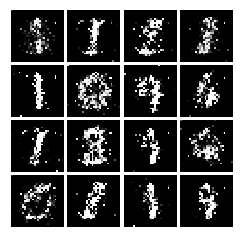

Epoch: 3, Iter: 1640, D: 0.2379, G:0.1709


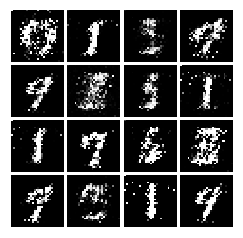

Epoch: 3, Iter: 1660, D: 0.18, G:0.2692


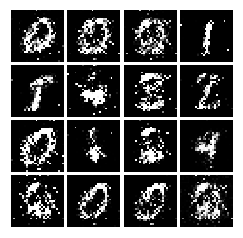

Epoch: 3, Iter: 1680, D: 0.1853, G:0.2092


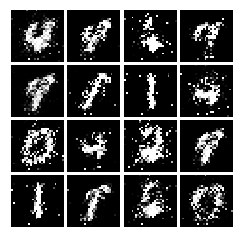

Epoch: 3, Iter: 1700, D: 0.1937, G:0.4611


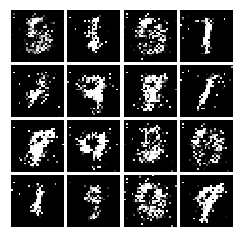

Epoch: 3, Iter: 1720, D: 0.1952, G:0.2733


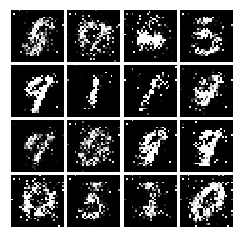

Epoch: 3, Iter: 1740, D: 0.1916, G:0.2363


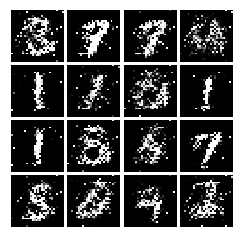

Epoch: 3, Iter: 1760, D: 0.187, G:0.3734


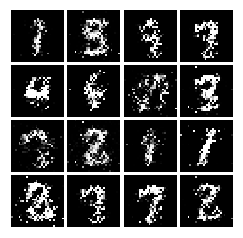

Epoch: 3, Iter: 1780, D: 0.1928, G:0.2777


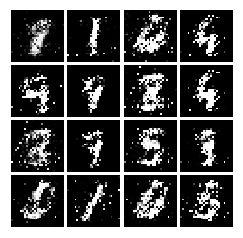

Epoch: 3, Iter: 1800, D: 0.2141, G:0.2425


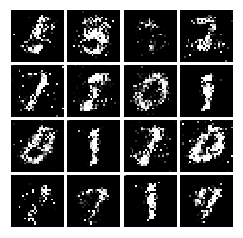

Epoch: 3, Iter: 1820, D: 0.192, G:0.2083


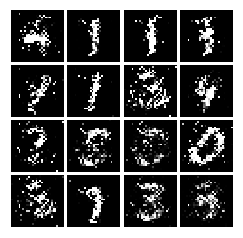

Epoch: 3, Iter: 1840, D: 0.1751, G:0.2016


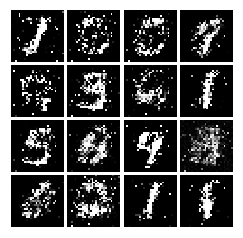

Epoch: 3, Iter: 1860, D: 0.1888, G:0.2309


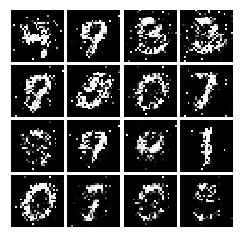

Epoch: 4, Iter: 1880, D: 0.1709, G:0.2236


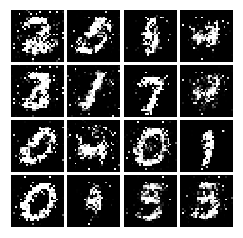

Epoch: 4, Iter: 1900, D: 0.2126, G:0.184


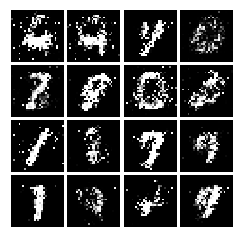

Epoch: 4, Iter: 1920, D: 0.1964, G:0.2094


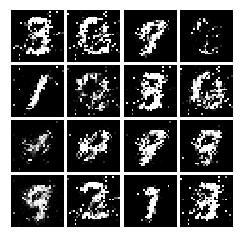

Epoch: 4, Iter: 1940, D: 0.1859, G:0.2855


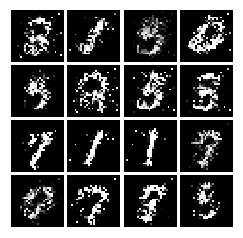

Epoch: 4, Iter: 1960, D: 0.204, G:0.2368


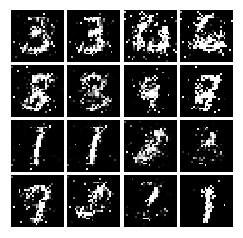

Epoch: 4, Iter: 1980, D: 0.2085, G:0.1827


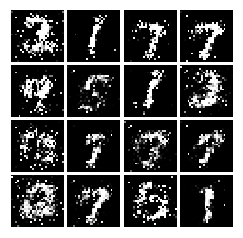

Epoch: 4, Iter: 2000, D: 0.1838, G:0.3159


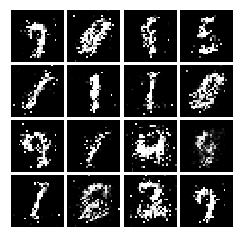

Epoch: 4, Iter: 2020, D: 0.1887, G:0.2


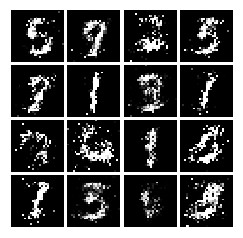

Epoch: 4, Iter: 2040, D: 0.2212, G:0.276


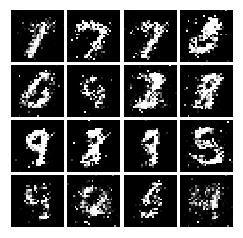

Epoch: 4, Iter: 2060, D: 0.2149, G:0.2185


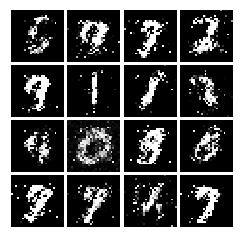

Epoch: 4, Iter: 2080, D: 0.199, G:0.1891


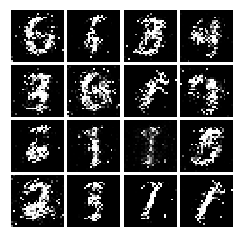

Epoch: 4, Iter: 2100, D: 0.2255, G:0.266


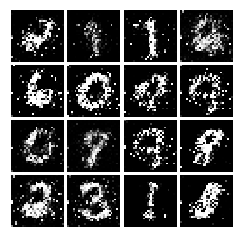

Epoch: 4, Iter: 2120, D: 0.2207, G:0.2046


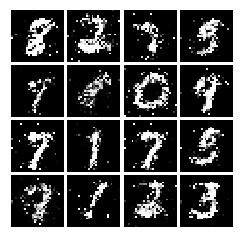

Epoch: 4, Iter: 2140, D: 0.1958, G:0.173


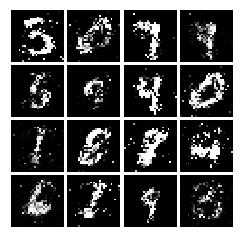

Epoch: 4, Iter: 2160, D: 0.2207, G:0.2075


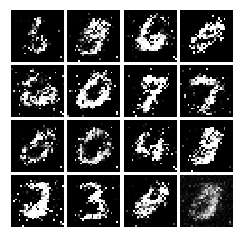

Epoch: 4, Iter: 2180, D: 0.2041, G:0.2013


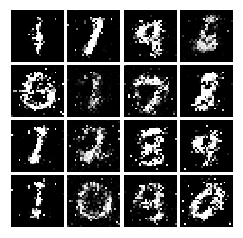

Epoch: 4, Iter: 2200, D: 0.2063, G:0.2169


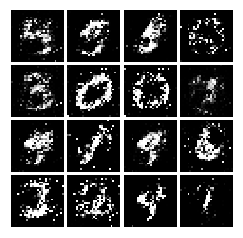

Epoch: 4, Iter: 2220, D: 0.1894, G:0.24


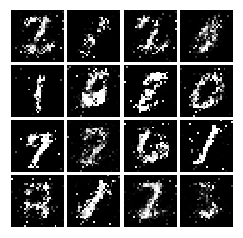

Epoch: 4, Iter: 2240, D: 0.2231, G:0.1641


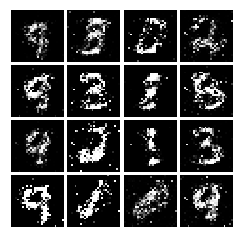

Epoch: 4, Iter: 2260, D: 0.201, G:0.227


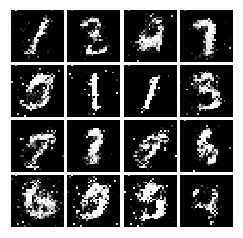

Epoch: 4, Iter: 2280, D: 0.2258, G:0.2374


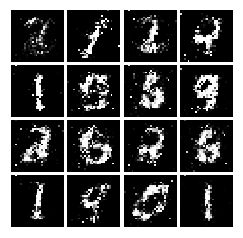

Epoch: 4, Iter: 2300, D: 0.2001, G:0.1505


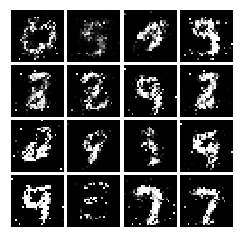

Epoch: 4, Iter: 2320, D: 0.2514, G:0.1721


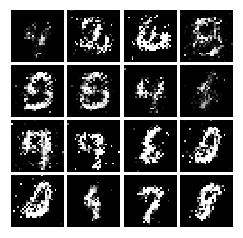

Epoch: 4, Iter: 2340, D: 0.1761, G:0.2365


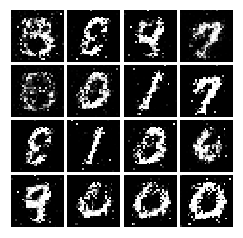

Epoch: 5, Iter: 2360, D: 0.1942, G:0.2468


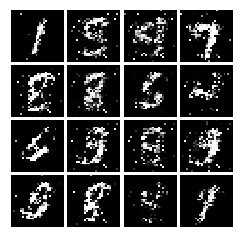

Epoch: 5, Iter: 2380, D: 0.2164, G:0.2007


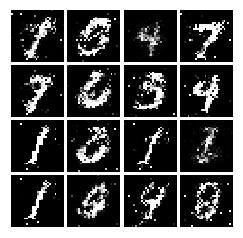

Epoch: 5, Iter: 2400, D: 0.2066, G:0.1949


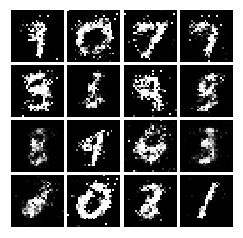

Epoch: 5, Iter: 2420, D: 0.1653, G:0.2556


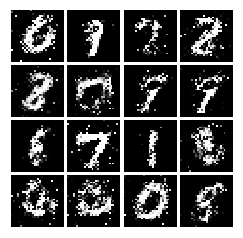

Epoch: 5, Iter: 2440, D: 0.198, G:0.1768


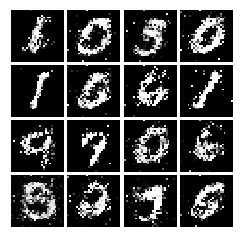

Epoch: 5, Iter: 2460, D: 0.198, G:0.3163


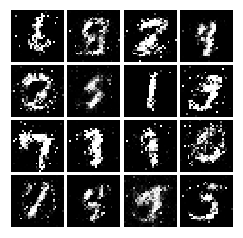

Epoch: 5, Iter: 2480, D: 0.2077, G:0.1781


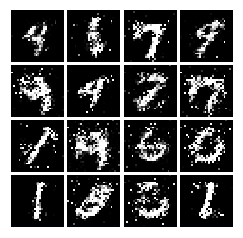

Epoch: 5, Iter: 2500, D: 0.2103, G:0.1769


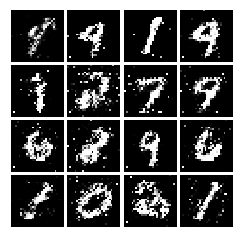

Epoch: 5, Iter: 2520, D: 0.2428, G:0.1567


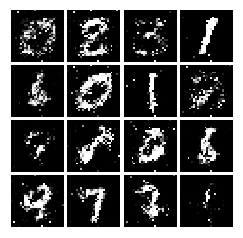

Epoch: 5, Iter: 2540, D: 0.236, G:0.1926


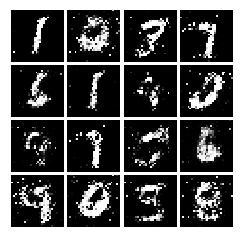

Epoch: 5, Iter: 2560, D: 0.2244, G:0.2034


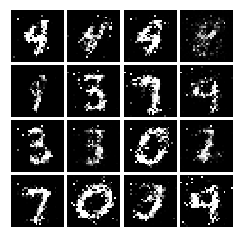

Epoch: 5, Iter: 2580, D: 0.2175, G:0.1762


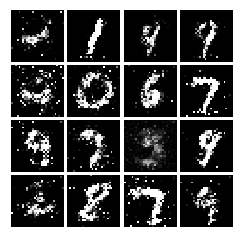

Epoch: 5, Iter: 2600, D: 0.2628, G:0.1737


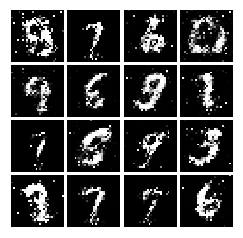

Epoch: 5, Iter: 2620, D: 0.227, G:0.186


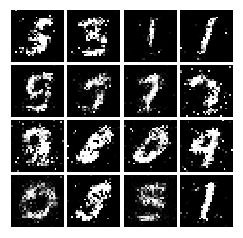

Epoch: 5, Iter: 2640, D: 0.2142, G:0.1921


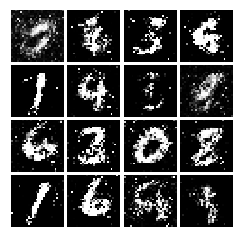

Epoch: 5, Iter: 2660, D: 0.2222, G:0.1582


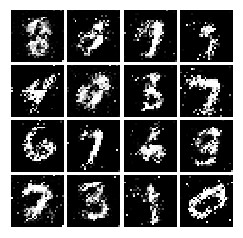

Epoch: 5, Iter: 2680, D: 0.2299, G:0.1586


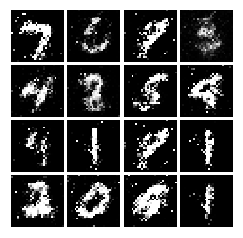

Epoch: 5, Iter: 2700, D: 0.2245, G:0.1824


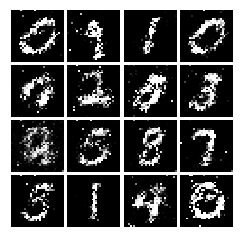

Epoch: 5, Iter: 2720, D: 0.2233, G:0.1915


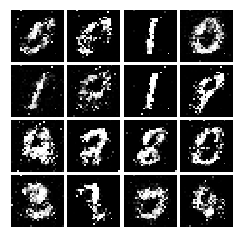

Epoch: 5, Iter: 2740, D: 0.2405, G:0.1845


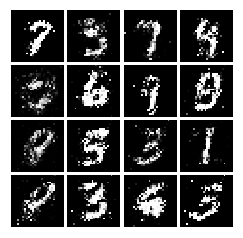

Epoch: 5, Iter: 2760, D: 0.2096, G:0.1595


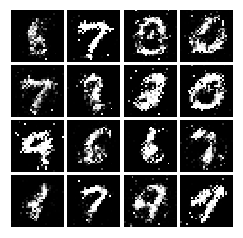

Epoch: 5, Iter: 2780, D: 0.2231, G:0.1651


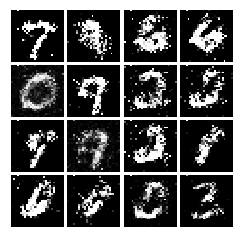

Epoch: 5, Iter: 2800, D: 0.2286, G:0.1821


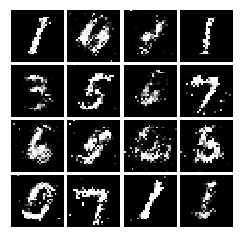

Epoch: 6, Iter: 2820, D: 0.2157, G:0.1817


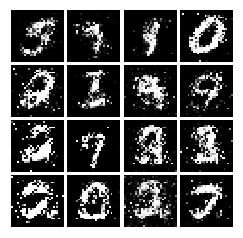

Epoch: 6, Iter: 2840, D: 0.2197, G:0.2672


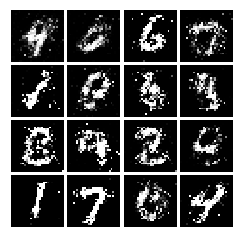

Epoch: 6, Iter: 2860, D: 0.2067, G:0.1758


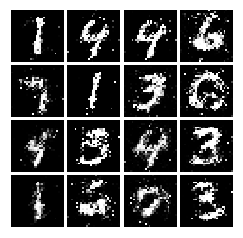

Epoch: 6, Iter: 2880, D: 0.1856, G:0.2176


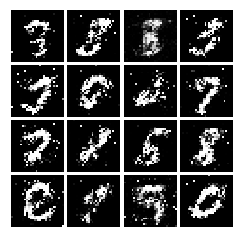

Epoch: 6, Iter: 2900, D: 0.2153, G:0.1922


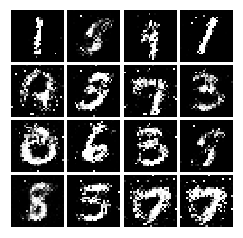

Epoch: 6, Iter: 2920, D: 0.2413, G:0.1616


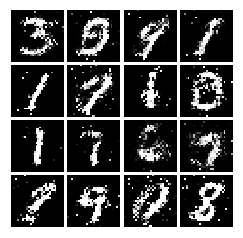

Epoch: 6, Iter: 2940, D: 0.2182, G:0.1537


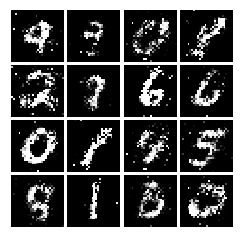

Epoch: 6, Iter: 2960, D: 0.2226, G:0.1708


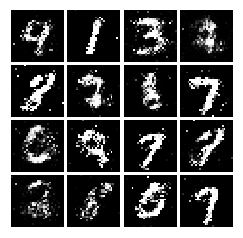

Epoch: 6, Iter: 2980, D: 0.2228, G:0.1721


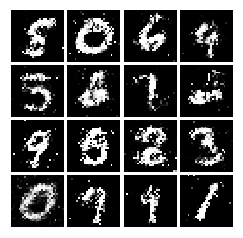

Epoch: 6, Iter: 3000, D: 0.2385, G:0.1801


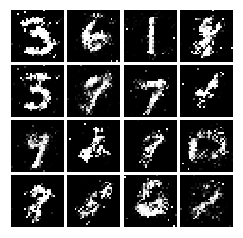

Epoch: 6, Iter: 3020, D: 0.2267, G:0.1858


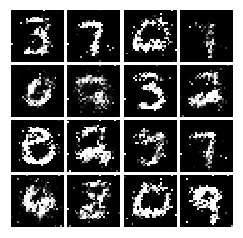

Epoch: 6, Iter: 3040, D: 0.2079, G:0.1986


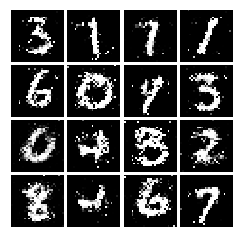

Epoch: 6, Iter: 3060, D: 0.2363, G:0.1899


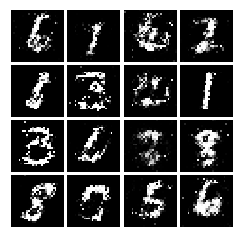

Epoch: 6, Iter: 3080, D: 0.2317, G:0.2042


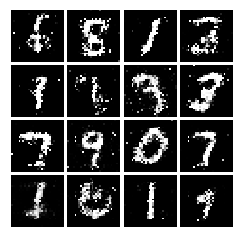

Epoch: 6, Iter: 3100, D: 0.2166, G:0.1795


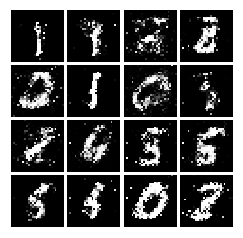

Epoch: 6, Iter: 3120, D: 0.2359, G:0.1377


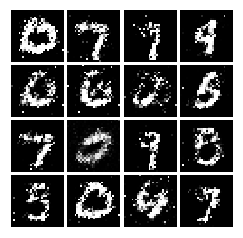

Epoch: 6, Iter: 3140, D: 0.2378, G:0.1643


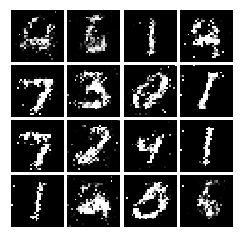

Epoch: 6, Iter: 3160, D: 0.2265, G:0.1932


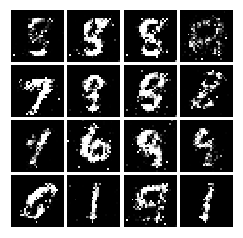

Epoch: 6, Iter: 3180, D: 0.2251, G:0.1572


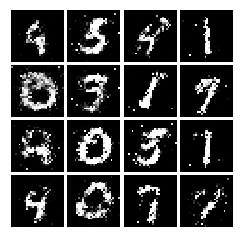

Epoch: 6, Iter: 3200, D: 0.1991, G:0.1955


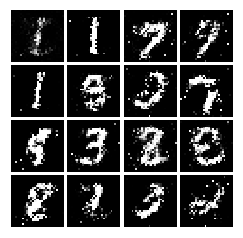

Epoch: 6, Iter: 3220, D: 0.2174, G:0.1741


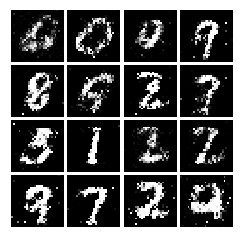

Epoch: 6, Iter: 3240, D: 0.2042, G:0.167


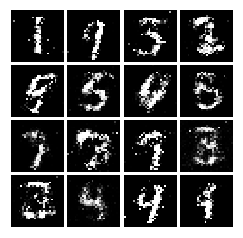

Epoch: 6, Iter: 3260, D: 0.264, G:0.1542


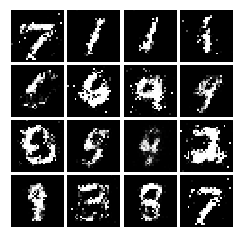

Epoch: 6, Iter: 3280, D: 0.2451, G:0.1763


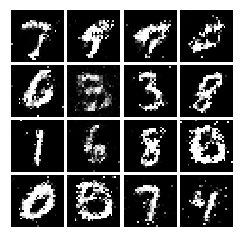

Epoch: 7, Iter: 3300, D: 0.2265, G:0.1584


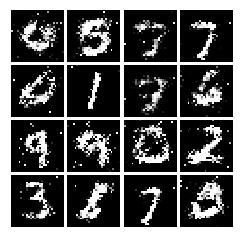

Epoch: 7, Iter: 3320, D: 0.2058, G:0.1671


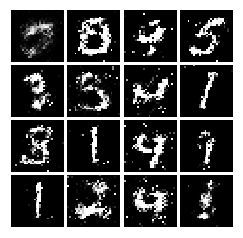

Epoch: 7, Iter: 3340, D: 0.2192, G:0.1913


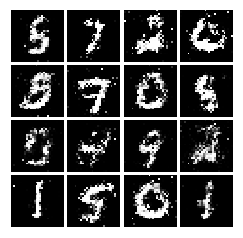

Epoch: 7, Iter: 3360, D: 0.2343, G:0.1501


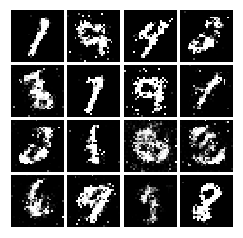

Epoch: 7, Iter: 3380, D: 0.2106, G:0.1725


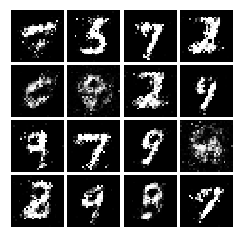

Epoch: 7, Iter: 3400, D: 0.2396, G:0.1403


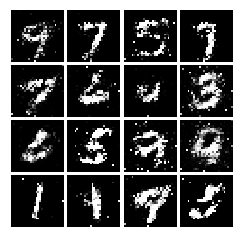

Epoch: 7, Iter: 3420, D: 0.2167, G:0.1789


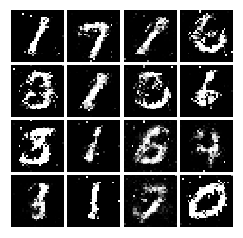

Epoch: 7, Iter: 3440, D: 0.2329, G:0.2117


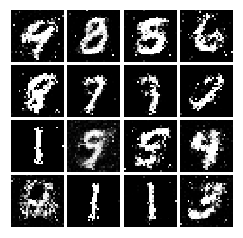

Epoch: 7, Iter: 3460, D: 0.2168, G:0.1507


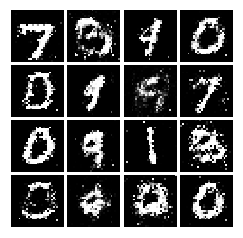

Epoch: 7, Iter: 3480, D: 0.2201, G:0.1612


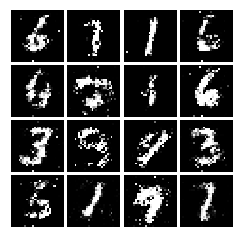

Epoch: 7, Iter: 3500, D: 0.2325, G:0.1634


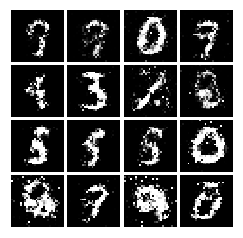

Epoch: 7, Iter: 3520, D: 0.2451, G:0.1503


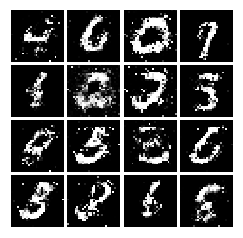

Epoch: 7, Iter: 3540, D: 0.2049, G:0.1705


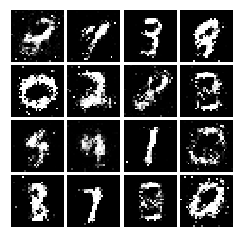

Epoch: 7, Iter: 3560, D: 0.2401, G:0.1684


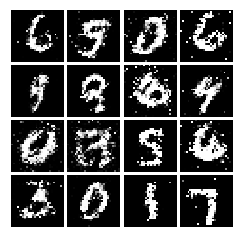

Epoch: 7, Iter: 3580, D: 0.2206, G:0.1973


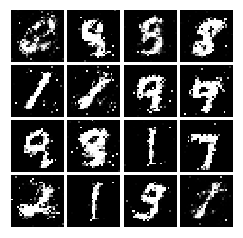

Epoch: 7, Iter: 3600, D: 0.2337, G:0.1724


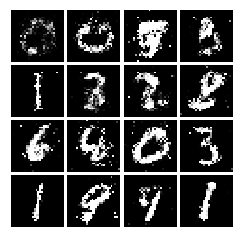

Epoch: 7, Iter: 3620, D: 0.2373, G:0.184


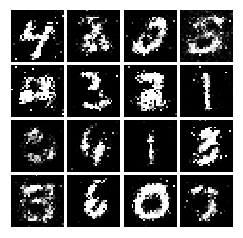

Epoch: 7, Iter: 3640, D: 0.2246, G:0.1607


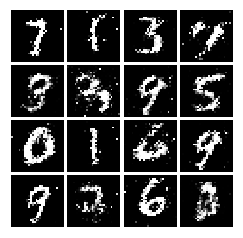

Epoch: 7, Iter: 3660, D: 0.2384, G:0.1716


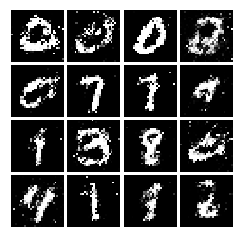

Epoch: 7, Iter: 3680, D: 0.2494, G:0.154


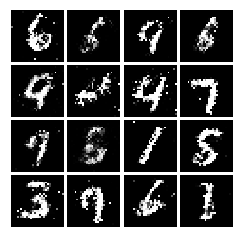

Epoch: 7, Iter: 3700, D: 0.2132, G:0.1825


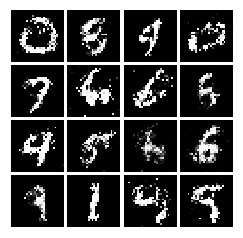

Epoch: 7, Iter: 3720, D: 0.2144, G:0.1777


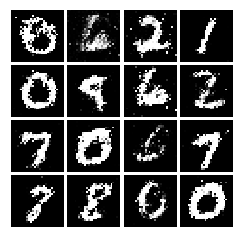

Epoch: 7, Iter: 3740, D: 0.2591, G:0.1444


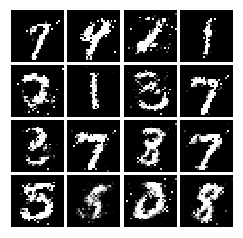

Epoch: 8, Iter: 3760, D: 0.2354, G:0.1709


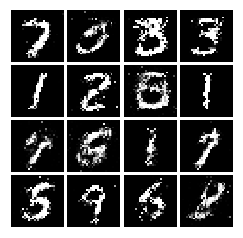

Epoch: 8, Iter: 3780, D: 0.2414, G:0.1438


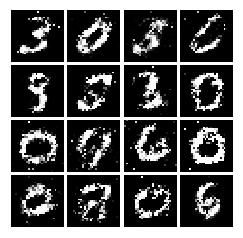

Epoch: 8, Iter: 3800, D: 0.2269, G:0.178


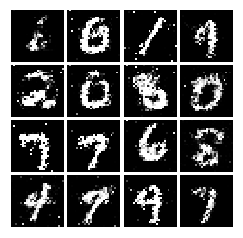

Epoch: 8, Iter: 3820, D: 0.2348, G:0.1526


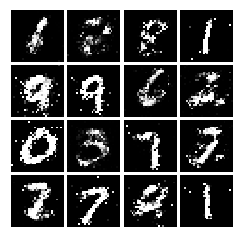

Epoch: 8, Iter: 3840, D: 0.2387, G:0.1489


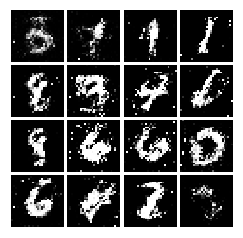

Epoch: 8, Iter: 3860, D: 0.2333, G:0.1942


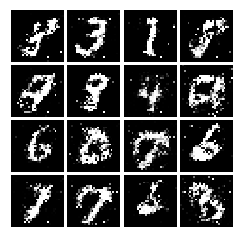

Epoch: 8, Iter: 3880, D: 0.221, G:0.1797


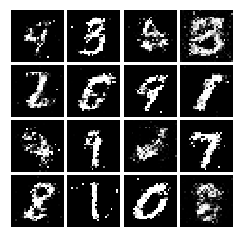

Epoch: 8, Iter: 3900, D: 0.2502, G:0.1549


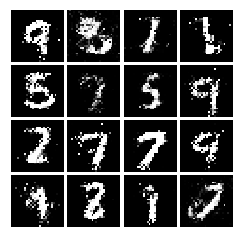

Epoch: 8, Iter: 3920, D: 0.2194, G:0.1564


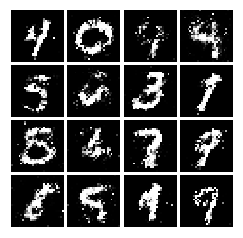

Epoch: 8, Iter: 3940, D: 0.2285, G:0.184


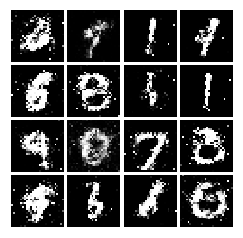

Epoch: 8, Iter: 3960, D: 0.2356, G:0.1566


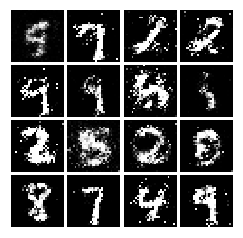

Epoch: 8, Iter: 3980, D: 0.219, G:0.1555


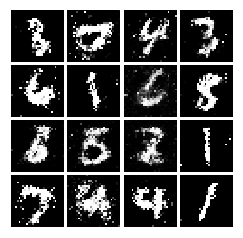

Epoch: 8, Iter: 4000, D: 0.2333, G:0.1498


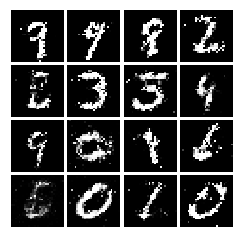

Epoch: 8, Iter: 4020, D: 0.2337, G:0.1594


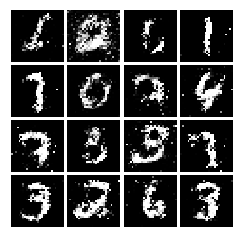

Epoch: 8, Iter: 4040, D: 0.226, G:0.1869


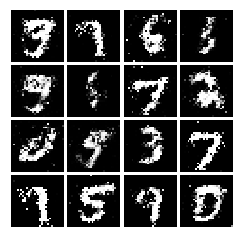

Epoch: 8, Iter: 4060, D: 0.2263, G:0.1369


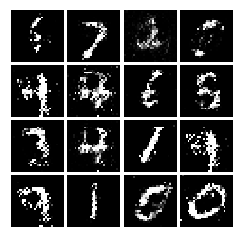

Epoch: 8, Iter: 4080, D: 0.2546, G:0.1535


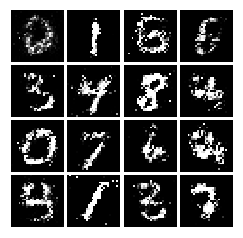

Epoch: 8, Iter: 4100, D: 0.2341, G:0.1551


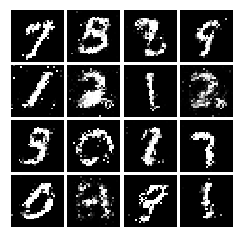

Epoch: 8, Iter: 4120, D: 0.2278, G:0.15


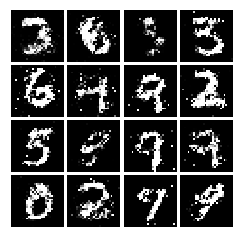

Epoch: 8, Iter: 4140, D: 0.2355, G:0.1718


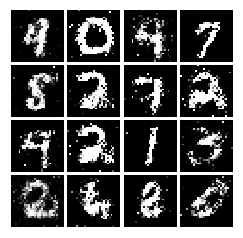

Epoch: 8, Iter: 4160, D: 0.2259, G:0.1762


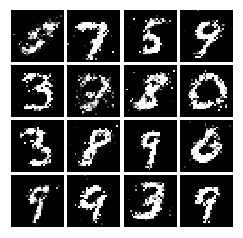

Epoch: 8, Iter: 4180, D: 0.2351, G:0.1491


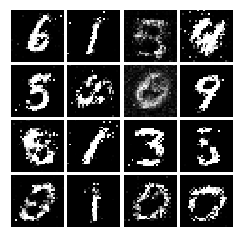

Epoch: 8, Iter: 4200, D: 0.228, G:0.1838


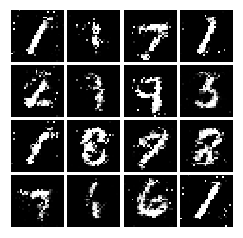

Epoch: 8, Iter: 4220, D: 0.249, G:0.219


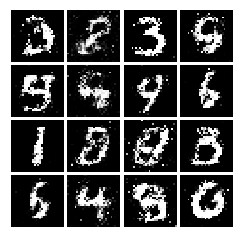

Epoch: 9, Iter: 4240, D: 0.228, G:0.1792


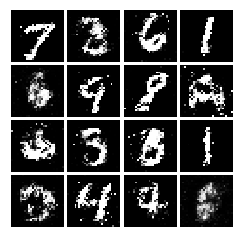

Epoch: 9, Iter: 4260, D: 0.2268, G:0.1771


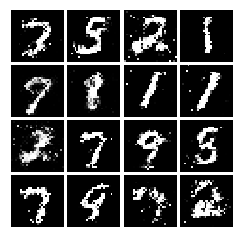

Epoch: 9, Iter: 4280, D: 0.2597, G:0.1794


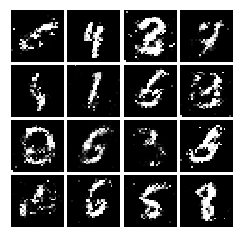

Epoch: 9, Iter: 4300, D: 0.2606, G:0.1692


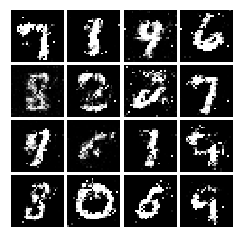

Epoch: 9, Iter: 4320, D: 0.2357, G:0.1683


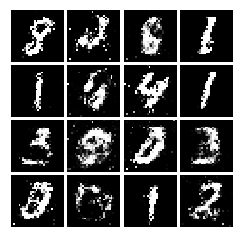

Epoch: 9, Iter: 4340, D: 0.2337, G:0.1811


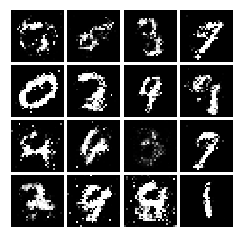

Epoch: 9, Iter: 4360, D: 0.2315, G:0.1648


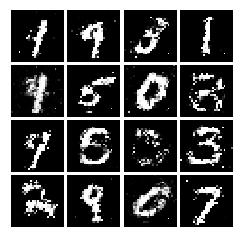

Epoch: 9, Iter: 4380, D: 0.2584, G:0.1491


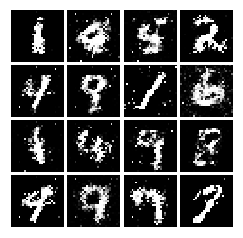

Epoch: 9, Iter: 4400, D: 0.217, G:0.1615


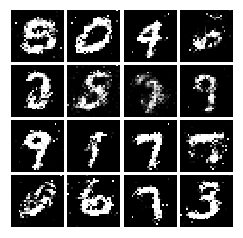

Epoch: 9, Iter: 4420, D: 0.2177, G:0.159


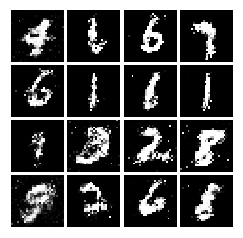

Epoch: 9, Iter: 4440, D: 0.2288, G:0.1606


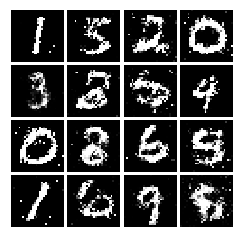

Epoch: 9, Iter: 4460, D: 0.2255, G:0.1709


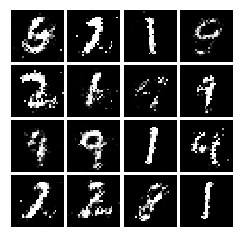

Epoch: 9, Iter: 4480, D: 0.2177, G:0.1801


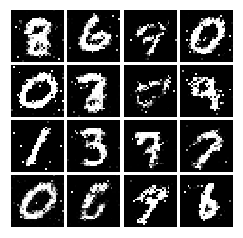

Epoch: 9, Iter: 4500, D: 0.2426, G:0.151


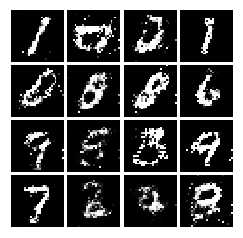

Epoch: 9, Iter: 4520, D: 0.2341, G:0.1721


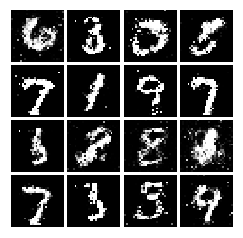

Epoch: 9, Iter: 4540, D: 0.2465, G:0.155


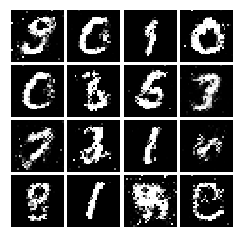

Epoch: 9, Iter: 4560, D: 0.2384, G:0.1785


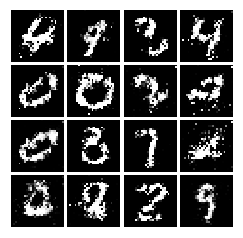

Epoch: 9, Iter: 4580, D: 0.2271, G:0.1677


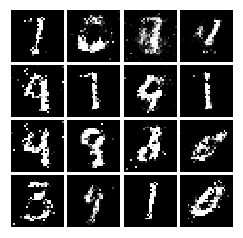

Epoch: 9, Iter: 4600, D: 0.2504, G:0.156


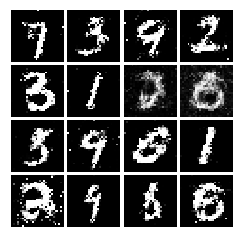

Epoch: 9, Iter: 4620, D: 0.2304, G:0.1688


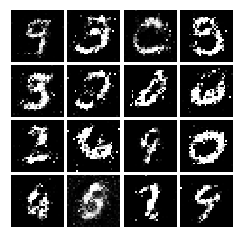

Epoch: 9, Iter: 4640, D: 0.2165, G:0.1593


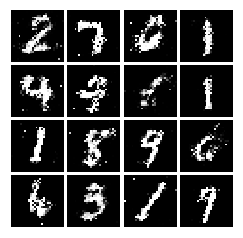

Epoch: 9, Iter: 4660, D: 0.2354, G:0.1613


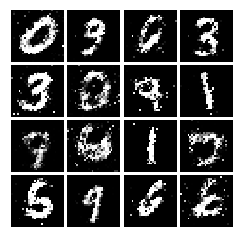

Epoch: 9, Iter: 4680, D: 0.2374, G:0.1477


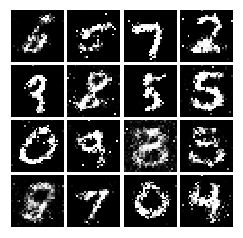

Final images


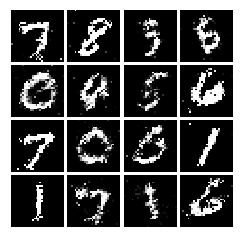

In [20]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [21]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Reshape((28, 28, 1), input_shape=(784,)),
        tf.keras.layers.Conv2D(32, 5),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPool2D(2),
        tf.keras.layers.Conv2D(64, 5),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPool2D(2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [34]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    tf.keras.layers.Dense(1024, input_shape=(noise_dim,), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(7*7*128, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape((7, 7, 128)),
    tf.keras.layers.Conv2DTranspose(64, 4, 2, activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(1, 4, 2, activation='tanh', padding='same')


    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.436, G:0.6486


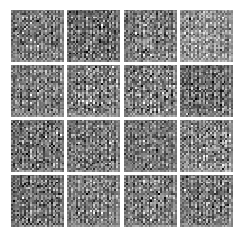

Epoch: 0, Iter: 20, D: 0.5695, G:1.465


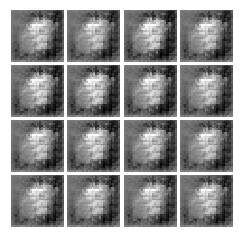

Epoch: 0, Iter: 40, D: 0.09492, G:4.782


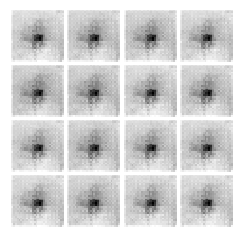

Epoch: 0, Iter: 60, D: 0.1306, G:7.061


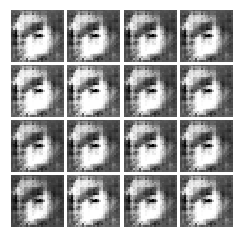

Epoch: 0, Iter: 80, D: 1.689, G:1.598


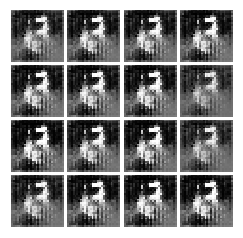

Epoch: 0, Iter: 100, D: 0.8645, G:3.145


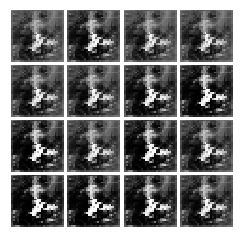

Epoch: 0, Iter: 120, D: 2.515, G:3.266


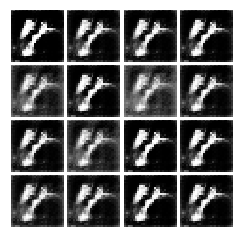

Epoch: 0, Iter: 140, D: 1.16, G:1.963


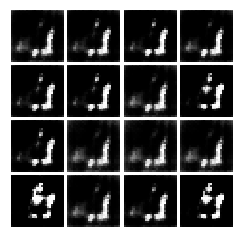

Epoch: 0, Iter: 160, D: 0.7805, G:3.884


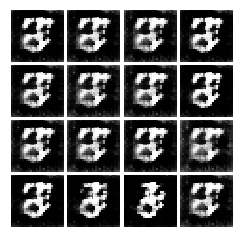

Epoch: 0, Iter: 180, D: 0.8499, G:1.672


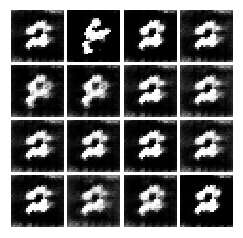

Epoch: 0, Iter: 200, D: 0.8567, G:1.12


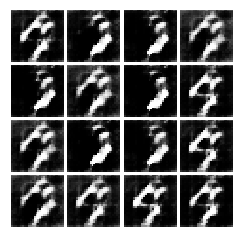

Epoch: 0, Iter: 220, D: 0.6277, G:1.865


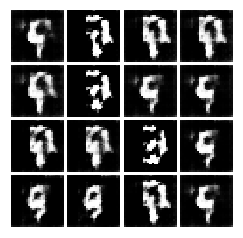

Epoch: 0, Iter: 240, D: 0.8708, G:1.065


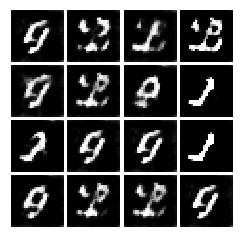

Epoch: 0, Iter: 260, D: 0.9797, G:1.264


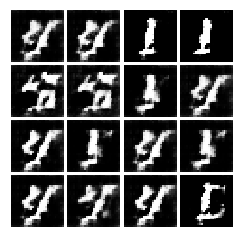

Epoch: 0, Iter: 280, D: 1.373, G:3.974


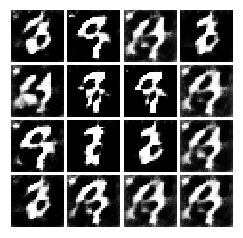

Epoch: 0, Iter: 300, D: 0.5927, G:2.434


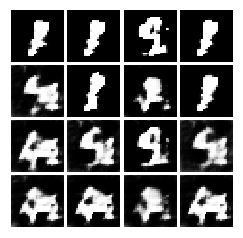

Epoch: 0, Iter: 320, D: 0.5749, G:2.826


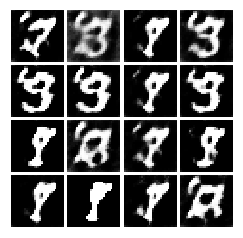

Epoch: 0, Iter: 340, D: 1.078, G:0.8491


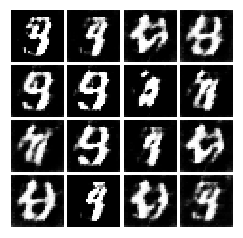

Epoch: 0, Iter: 360, D: 0.2988, G:3.352


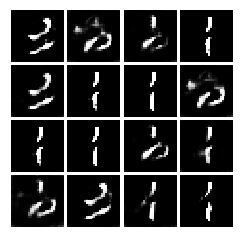

Epoch: 0, Iter: 380, D: 0.5571, G:2.01


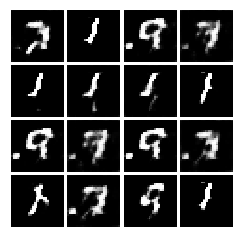

Epoch: 0, Iter: 400, D: 0.7055, G:2.495


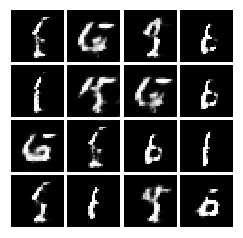

Epoch: 0, Iter: 420, D: 0.7488, G:2.536


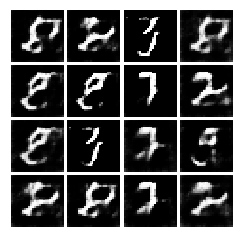

Epoch: 0, Iter: 440, D: 0.4874, G:2.282


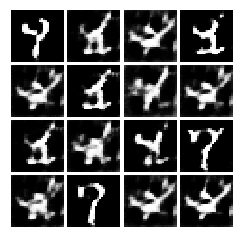

Epoch: 0, Iter: 460, D: 0.737, G:1.769


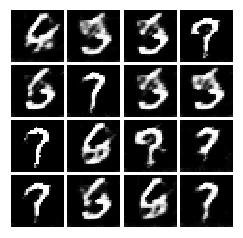

Epoch: 1, Iter: 480, D: 0.4858, G:2.532


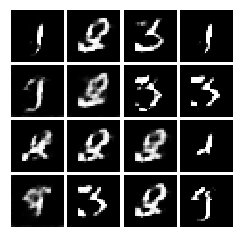

Epoch: 1, Iter: 500, D: 0.957, G:1.091


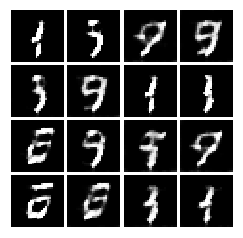

Epoch: 1, Iter: 520, D: 0.9855, G:3.555


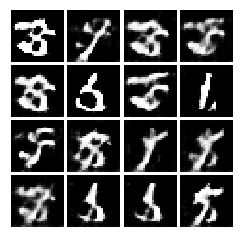

Epoch: 1, Iter: 540, D: 0.5266, G:2.777


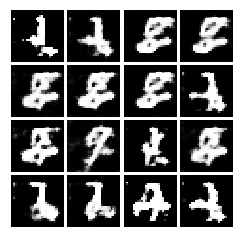

Epoch: 1, Iter: 560, D: 0.981, G:6.135


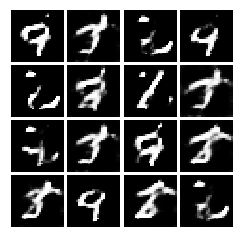

Epoch: 1, Iter: 580, D: 0.6774, G:1.794


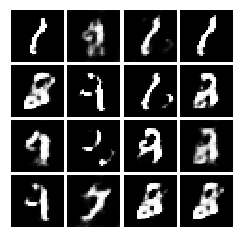

Epoch: 1, Iter: 600, D: 0.3784, G:2.785


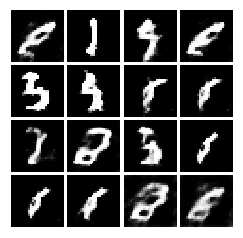

Epoch: 1, Iter: 620, D: 1.035, G:3.63


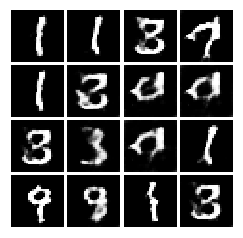

Epoch: 1, Iter: 640, D: 0.7619, G:2.067


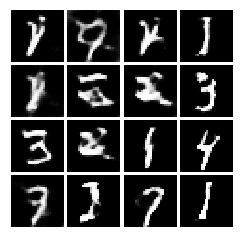

Epoch: 1, Iter: 660, D: 0.4239, G:2.326


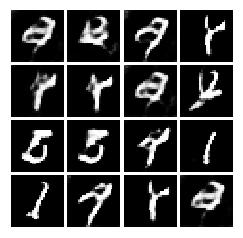

Epoch: 1, Iter: 680, D: 0.7554, G:1.96


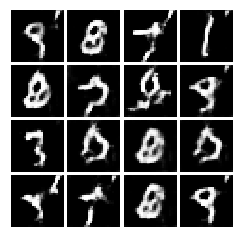

Epoch: 1, Iter: 700, D: 0.7132, G:2.417


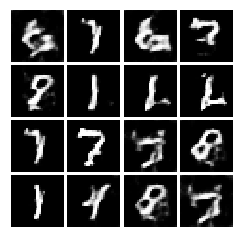

Epoch: 1, Iter: 720, D: 0.8733, G:4.049


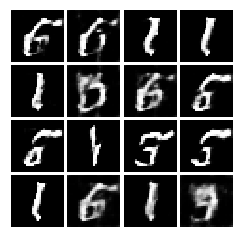

Epoch: 1, Iter: 740, D: 0.6608, G:3.02


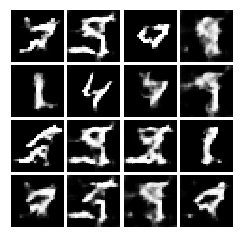

Epoch: 1, Iter: 760, D: 0.751, G:1.92


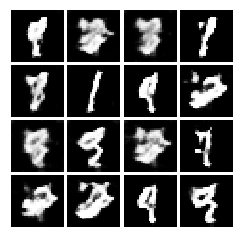

Epoch: 1, Iter: 780, D: 0.7068, G:1.925


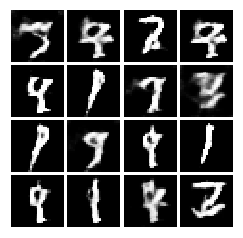

Epoch: 1, Iter: 800, D: 0.8039, G:1.923


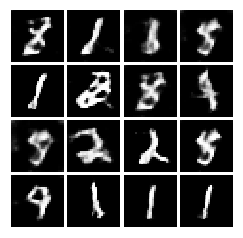

Epoch: 1, Iter: 820, D: 0.9202, G:0.8343


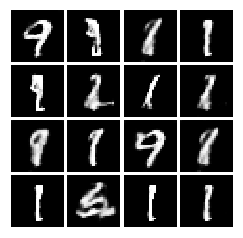

Epoch: 1, Iter: 840, D: 1.255, G:2.512


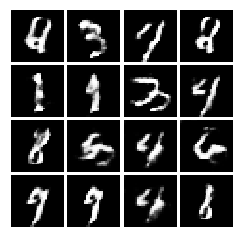

Epoch: 1, Iter: 860, D: 0.6914, G:2.453


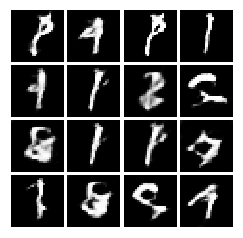

Epoch: 1, Iter: 880, D: 0.6767, G:1.587


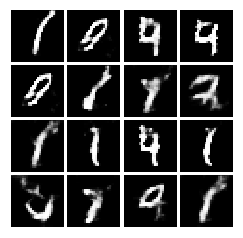

Epoch: 1, Iter: 900, D: 0.6833, G:2.442


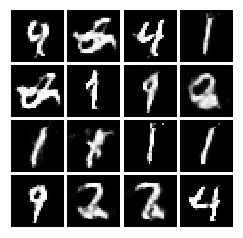

Epoch: 1, Iter: 920, D: 0.674, G:1.78


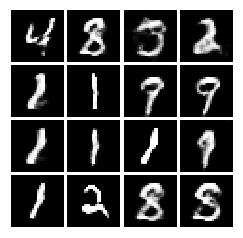

Epoch: 2, Iter: 940, D: 0.8246, G:1.716


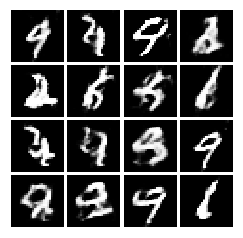

Epoch: 2, Iter: 960, D: 0.6308, G:2.146


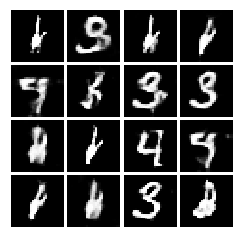

Epoch: 2, Iter: 980, D: 1.06, G:1.649


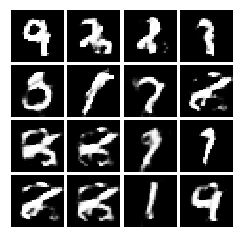

Epoch: 2, Iter: 1000, D: 0.8022, G:2.832


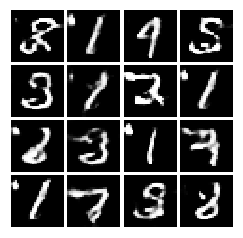

Epoch: 2, Iter: 1020, D: 0.7386, G:1.979


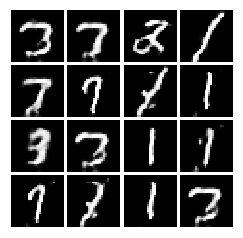

Epoch: 2, Iter: 1040, D: 0.5988, G:1.763


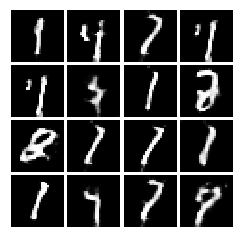

Epoch: 2, Iter: 1060, D: 0.6192, G:3.289


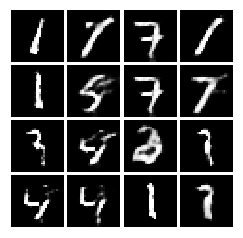

Epoch: 2, Iter: 1080, D: 0.7799, G:1.563


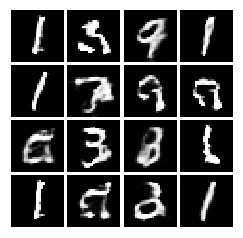

Epoch: 2, Iter: 1100, D: 0.7899, G:2.01


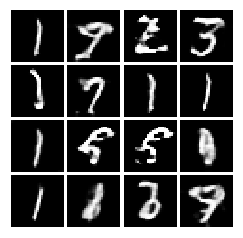

Epoch: 2, Iter: 1120, D: 0.6837, G:2.292


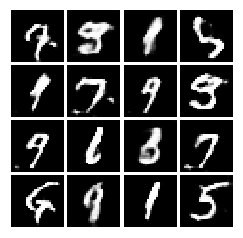

Epoch: 2, Iter: 1140, D: 0.8042, G:2.593


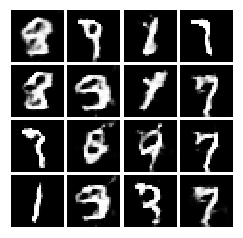

Epoch: 2, Iter: 1160, D: 1.209, G:1.238


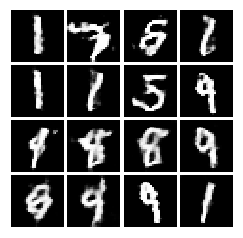

Epoch: 2, Iter: 1180, D: 0.7211, G:2.285


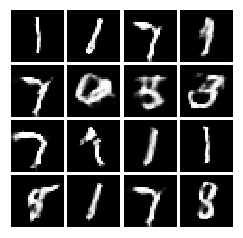

Epoch: 2, Iter: 1200, D: 0.6512, G:2.008


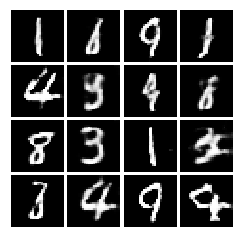

Epoch: 2, Iter: 1220, D: 0.7066, G:1.921


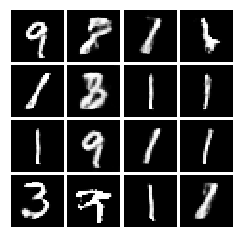

Epoch: 2, Iter: 1240, D: 0.638, G:1.508


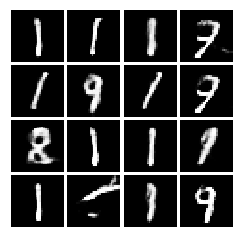

Epoch: 2, Iter: 1260, D: 0.6199, G:1.81


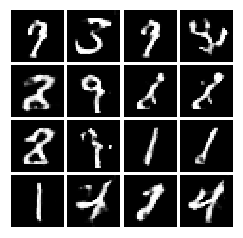

Epoch: 2, Iter: 1280, D: 0.7216, G:1.97


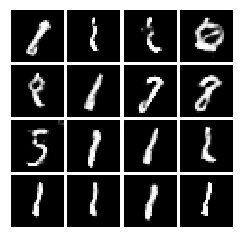

Epoch: 2, Iter: 1300, D: 0.5558, G:2.25


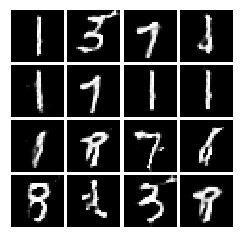

Epoch: 2, Iter: 1320, D: 0.5704, G:1.748


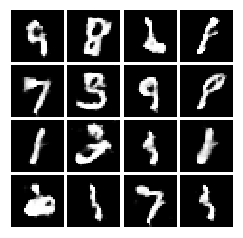

Epoch: 2, Iter: 1340, D: 0.5849, G:1.823


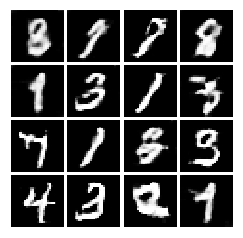

Epoch: 2, Iter: 1360, D: 0.6441, G:2.025


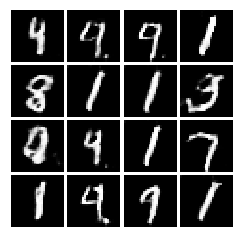

Epoch: 2, Iter: 1380, D: 0.7291, G:1.752


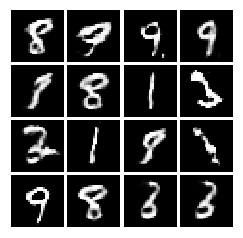

Epoch: 2, Iter: 1400, D: 0.6944, G:1.897


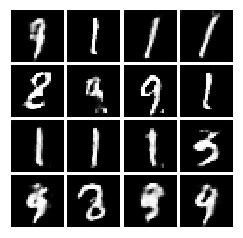

Epoch: 3, Iter: 1420, D: 0.6685, G:2.306


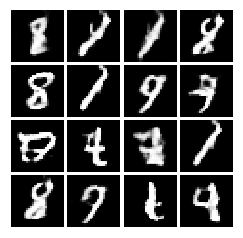

Epoch: 3, Iter: 1440, D: 0.6756, G:1.861


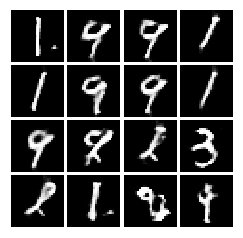

Epoch: 3, Iter: 1460, D: 0.7485, G:1.933


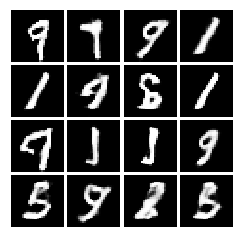

Epoch: 3, Iter: 1480, D: 0.7932, G:1.88


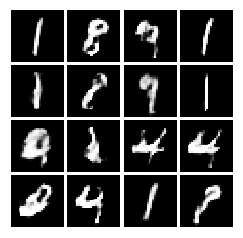

Epoch: 3, Iter: 1500, D: 0.7892, G:1.86


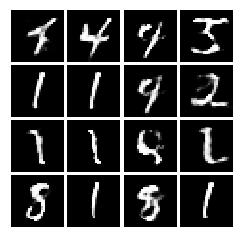

Epoch: 3, Iter: 1520, D: 0.5906, G:2.23


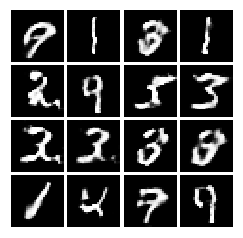

Epoch: 3, Iter: 1540, D: 0.622, G:2.577


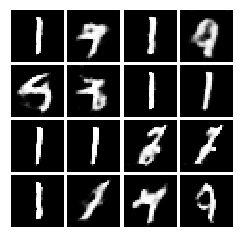

Epoch: 3, Iter: 1560, D: 0.67, G:2.156


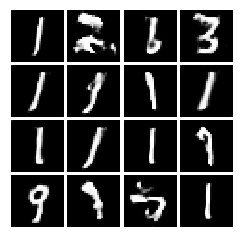

Epoch: 3, Iter: 1580, D: 0.6907, G:1.577


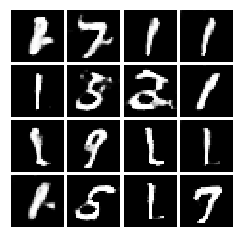

Epoch: 3, Iter: 1600, D: 0.7854, G:1.929


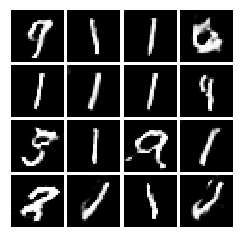

Epoch: 3, Iter: 1620, D: 0.4875, G:2.585


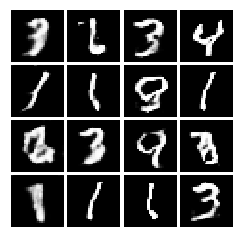

Epoch: 3, Iter: 1640, D: 0.7212, G:1.987


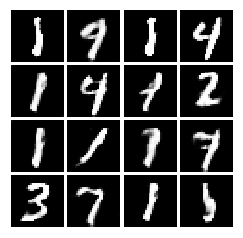

Epoch: 3, Iter: 1660, D: 0.7646, G:2.318


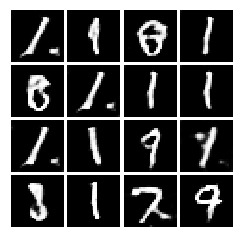

Epoch: 3, Iter: 1680, D: 0.5683, G:1.828


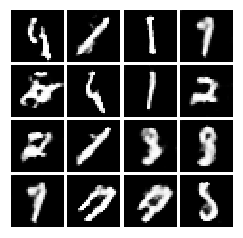

Epoch: 3, Iter: 1700, D: 0.5901, G:2.09


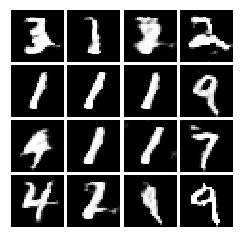

Epoch: 3, Iter: 1720, D: 0.9531, G:2.348


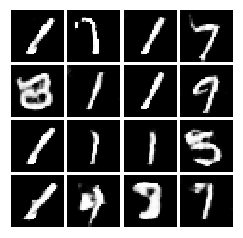

Epoch: 3, Iter: 1740, D: 0.646, G:1.918


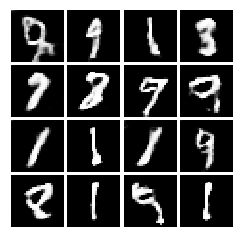

Epoch: 3, Iter: 1760, D: 0.5456, G:2.53


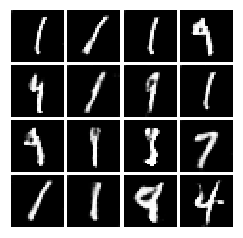

Epoch: 3, Iter: 1780, D: 0.6047, G:2.034


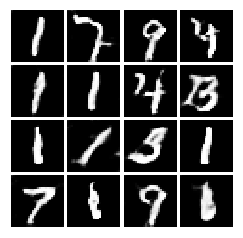

Epoch: 3, Iter: 1800, D: 0.693, G:1.538


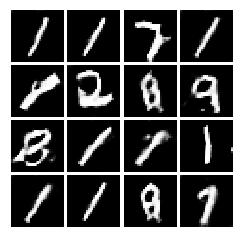

Epoch: 3, Iter: 1820, D: 0.7826, G:1.627


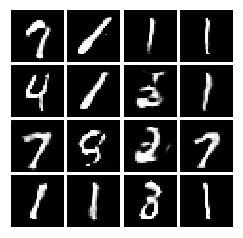

Epoch: 3, Iter: 1840, D: 0.6297, G:1.714


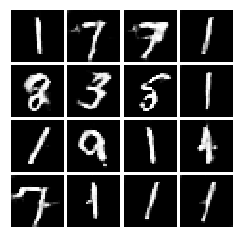

Epoch: 3, Iter: 1860, D: 0.7876, G:1.388


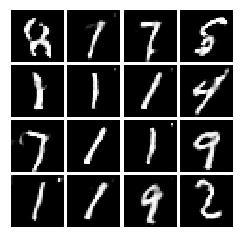

Epoch: 4, Iter: 1880, D: 0.654, G:2.145


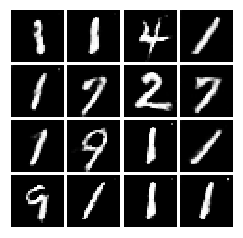

Epoch: 4, Iter: 1900, D: 0.6325, G:1.775


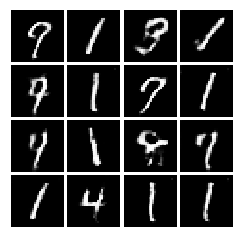

Epoch: 4, Iter: 1920, D: 0.6241, G:1.87


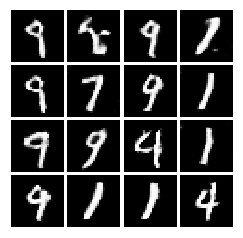

Epoch: 4, Iter: 1940, D: 0.4977, G:1.957


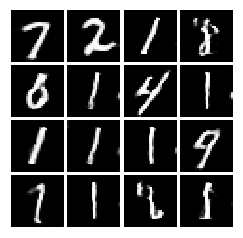

Epoch: 4, Iter: 1960, D: 0.6769, G:1.766


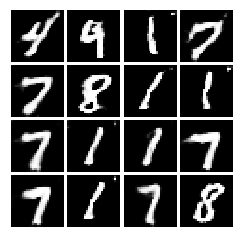

Epoch: 4, Iter: 1980, D: 0.6134, G:1.542


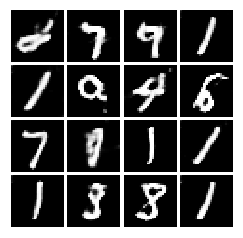

Epoch: 4, Iter: 2000, D: 1.102, G:1.386


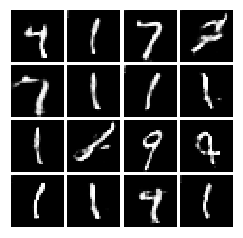

Epoch: 4, Iter: 2020, D: 0.7457, G:2.013


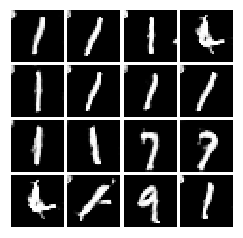

Epoch: 4, Iter: 2040, D: 0.7751, G:1.738


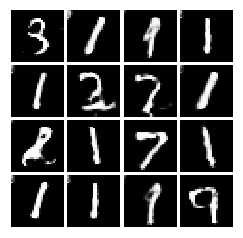

Epoch: 4, Iter: 2060, D: 0.4863, G:1.639


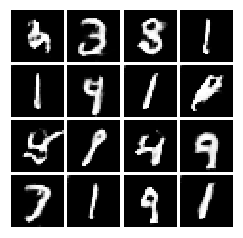

Epoch: 4, Iter: 2080, D: 0.6305, G:1.914


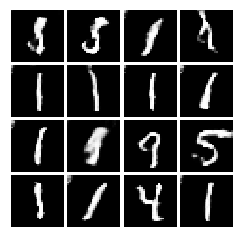

Epoch: 4, Iter: 2100, D: 0.6218, G:2.159


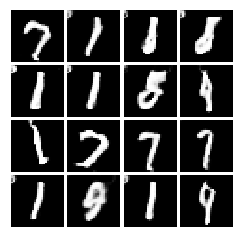

Epoch: 4, Iter: 2120, D: 0.7732, G:1.748


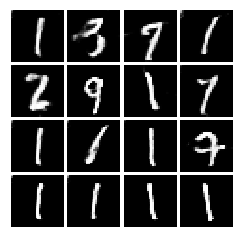

Epoch: 4, Iter: 2140, D: 0.6539, G:1.816


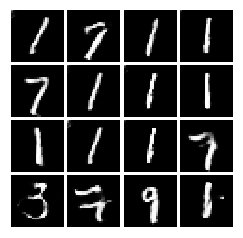

Epoch: 4, Iter: 2160, D: 0.7437, G:1.722


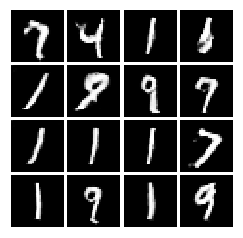

Epoch: 4, Iter: 2180, D: 0.6164, G:1.617


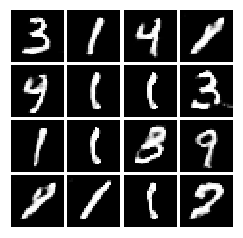

Epoch: 4, Iter: 2200, D: 0.655, G:1.577


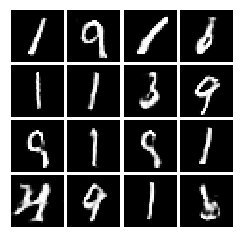

Epoch: 4, Iter: 2220, D: 0.6401, G:1.909


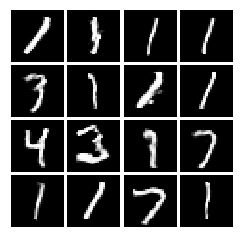

Epoch: 4, Iter: 2240, D: 0.6369, G:1.966


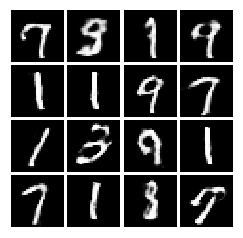

Epoch: 4, Iter: 2260, D: 0.6199, G:1.821


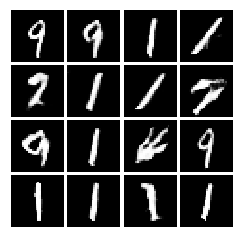

Epoch: 4, Iter: 2280, D: 0.5471, G:2.043


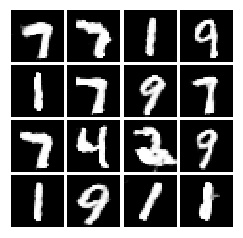

Epoch: 4, Iter: 2300, D: 0.6812, G:1.886


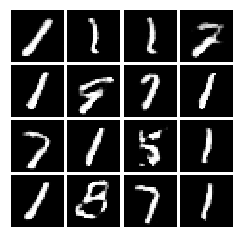

Epoch: 4, Iter: 2320, D: 0.6294, G:2.265


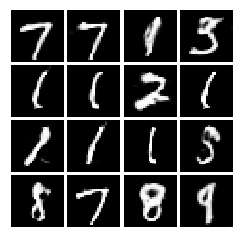

Epoch: 4, Iter: 2340, D: 0.9342, G:2.862


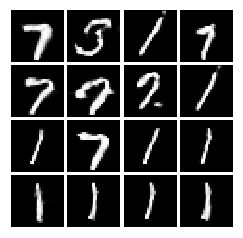

Final images


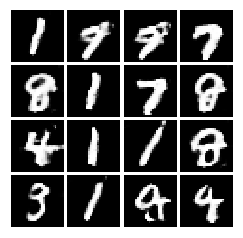

In [36]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

In [38]:
x,y = (1,1)
for _ in range(6):
    y += x
    x -= y
    print(x,y)

-1 2
-2 1
-1 -1
1 -2
2 -1
1 1


### Your answer:

$\min_x\max_y f(x,y)$ evaluates to 0. Because for positive x, y can be postive and can achieve f>0, and for negative x, y can be negative and achieve f>0.
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |   2   |   1   |  -1   |  -2   | -1    |   1  |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |  -1   |   -2  |  -1   |  1    |  2    |    1 |       
   

## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 
f(x,y) = 0 is a saddle point of the function, this is the optimum value of the minmax problem. This means that near f=0, there is a direction that maximizes f and a direction that minimizes f. However, minimizing w.r.t x will always try to go towards the minima, while maximizing w.r.t y will always go towards the maxima, hence the function will oscillate and never converge.

## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
This isn't a good sign. It means the generator is learning to fool the discriminator much faster than the discriminator learns to discriminate the fake and real data. This could be a bug in the code as generally the discriminator should learn to discriminate noisy images from real images. If not, it could mean the discriminator training has collapsed due to exploding/vanishing gradients. The generator should at the start of training produce only noisy images, so if the discriminator cannot disctinguish real images from noise, the generator will not be able to produce realistic images.